#### Hybrid-Hierarchical Fashion Graph Attention Network for Compatibility-Oriented and Personalized Outfit Recommendation
- Sajjad saed
- Babak Teimourpour (Ph.D.)

If you use the datasets or findings from our paper, please cite our paper in your work:
http://arxiv.org/abs/2508.11105

@article{saed2025hybrid,
  title={Hybrid-Hierarchical Fashion Graph Attention Network for Compatibility-Oriented and Personalized Outfit Recommendation},
  author={Saed, Sajjad and Teimourpour, Babak},
  journal={arXiv preprint arXiv:2508.11105},
  year={2025},
 doi={10.48550/arXiv.2508.11105}
}

### ✅ FGAT model implementation
##### Fashion Graph Attention Network
## ********************************************************************************

![Figure-2.png](attachment:Figure-2.png)
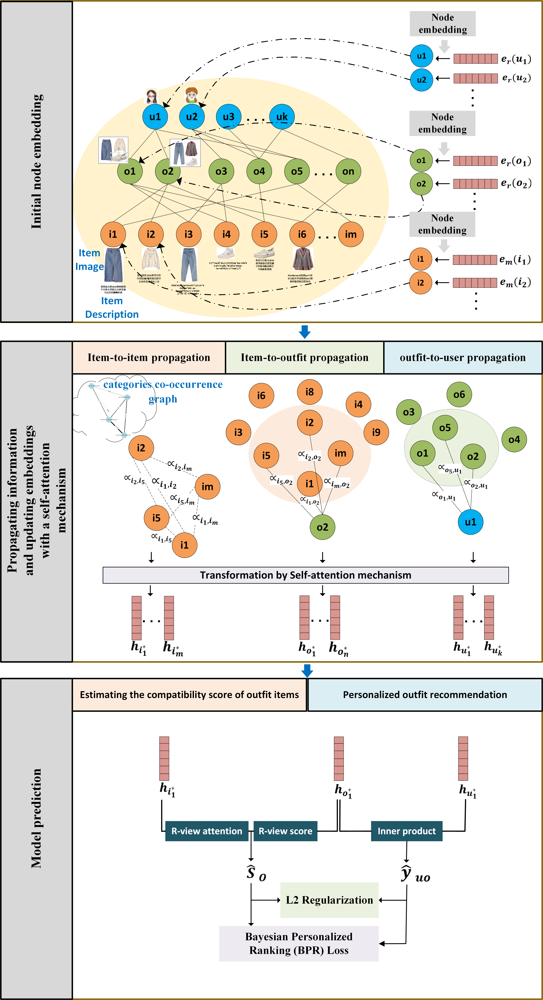

## ********************************************************************************

In [ ]:
!pip install torch_geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 35.2 MB/s eta 0:00:00


In [ ]:
!pip install arabic_reshaper python-bidi

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 292.9/292.9 kB 18.2 MB/s eta 0:00:00


#### -Importing libraries

In [ ]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch_geometric.data import Data
from torch_geometric.nn import MessagePassing
from torch_geometric.utils import add_self_loops, degree
from torchvision import models, transforms
from PIL import Image
from sklearn.model_selection import train_test_split
import networkx as nx
import matplotlib.pyplot as plt
import random
import matplotlib.patches as mpatches
from matplotlib.patches import FancyArrowPatch
import os
import requests
import torchvision.transforms as transforms
from PIL import Image
from transformers import BertTokenizer, BertModel
from collections import defaultdict
import arabic_reshaper
from bidi.algorithm import get_display

### ✅ 3.1 Data collection and preprocessing: Loading POG dataset and printing a statistic of data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd

# 1️⃣ Load the datasets
data_path='/content/drive/MyDrive/HHFGAT_project/hierarchical_fashion_graph_network/Data/pog/'
item_data = pd.read_csv(data_path+'item_data.txt', header=None)
outfit_data = pd.read_csv(data_path+'outfit_data.txt', header=None)
user_data = pd.read_csv(data_path+'user_data.txt', header=None)

item_data.columns = ['item_id', 'category', 'image_url', 'title']
outfit_data.columns = ['outfit_id', 'items']
user_data.columns = ['user_id', 'outfits']

# 3️⃣
# Item data
item_ids = item_data['item_id'].unique()
item_count = len(item_ids)
categories = item_data['category'].unique()
category_count = len(categories)

# Outfit data
outfit_ids = outfit_data['outfit_id'].unique()
outfit_count = len(outfit_ids)

# User data
user_ids = user_data['user_id'].unique()
user_count = len(user_ids)

# Display the results
print(f"Total item_ids: {item_count}")
print(f"Total categories: {category_count}")
print(f"Total outfit_ids: {outfit_count}")
print(f"Total user_ids: {user_count}")

#4️⃣ View some sample data
print("Sample item data:")
print(item_data.head())

print("\n Sample outfit data:")
print(outfit_data.head())

print("\n Sample user data:")
print(user_data.head())


Total item_ids: 19175
Total categories: 61
Total outfit_ids: 9373
Total user_ids: 277469
Sample item data:
   item_id  category                                          image_url  \
0        0         3  http://gw.alicdn.com/imgextra/i3/18/O1CN01b5qP...   
1        1        10  http://gw.alicdn.com/imgextra/i4/67/O1CN010921...   
2        2        43  http://gw.alicdn.com/imgextra/i3/77/O1CN01I1Kw...   
3        3        16  http://gw.alicdn.com/imgextra/i4/190/O1CN01tu5...   
4        4        46  http://gw.alicdn.com/imgextra/i4/13/O1CN01kHo0...   

                                    title  
0  yeah jewelry官方店 原创设计首饰小人国耳钉925银镀金女礼物饰品  
1         20199秋冬季新款女装黑色修身长裙气质打底裙中长款毛呢连衣裙  
2         芍药居少女原创 万能打底裤女薄款经典高腰少女黑直筒紧身裤19春  
3          阿俪克斯高腰阔腿裤女春季2019新款刺绣街头条纹开叉运动裤子  
4        Sogo★个性卡通刺绣水洗做旧牛仔弯檐棒球帽男女情侣街头鸭舌帽潮  

 Sample outfit data:
   outfit_id                        items
0          0               15843;245;5923
1          1                891;5964;4403
2          2      2243;5098;42

In [ ]:
import torch

In [ ]:
torch.__version__

'2.6.0+cu124'

In [ ]:
pip install torch-scatter

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.0/108.0 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... canceled
ERROR: Operation cancelled by user


### ✅ 3-2 Constructing and displaying a three-level fashion graph network

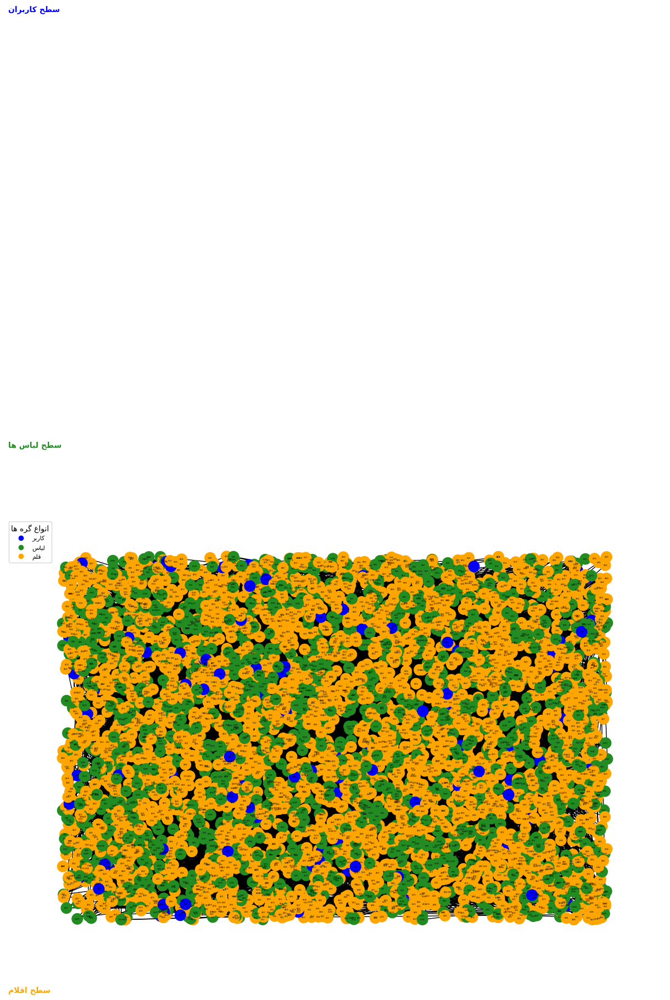

In [ ]:
import numpy as np
import pandas as pd
import networkx as nx
import scipy.sparse as sp
random.seed(42)

sample_item_data = item_data.sample(n=len(item_ids), random_state=42)
sample_outfit_data = outfit_data[outfit_data['outfit_id'].isin(
    outfit_data['outfit_id'].sample(n=len(outfit_ids), random_state=42)
)].copy()

valid_items = set()
for items_str in sample_outfit_data['items']:
    valid_items.update([int(i) for i in items_str.split(';')])
valid_items = valid_items.intersection(set(sample_item_data['item_id']))

sample_item_data = sample_item_data[sample_item_data['item_id'].isin(valid_items)].copy()

valid_outfits = set(sample_outfit_data['outfit_id'])

# def filter_user_outfits(outfits_str):
#     outfits = [int(o) for o in outfits_str.split(';')]
#     filtered = [str(o) for o in outfits if o in valid_outfits]
#     return ';'.join(filtered)
def filter_user_outfits(outfits_str):
    outfits = str(outfits_str).split(';')  # تبدیل به رشته
    filtered = [o for o in outfits if int(o) in valid_outfits]
    return ';'.join(filtered)


sample_user_data = user_data.copy()
sample_user_data['outfits'] = sample_user_data['outfits'].apply(filter_user_outfits)
sample_user_data = sample_user_data[sample_user_data['outfits'] != '']
sample_user_data = sample_user_data.sample(n=len(user_ids), random_state=42)


# 1️⃣ Hierarchical Fashion Graph Construction
def build_hierarchical_graph(item_data, outfit_data, user_data):
    G = nx.Graph()

    item_color = 'orange'
    outfit_color = 'forestgreen'
    user_color = 'blue'

    item_ids = sorted(item_data['item_id'].astype(int).unique())
    outfit_ids = sorted(outfit_data['outfit_id'].astype(int).unique())
    user_ids = sorted(user_data['user_id'].astype(int).unique())


    for _, row in item_data.iterrows():
        G.add_node(int(row['item_id']), label=f"I{row['item_id']}", color=item_color)

    for _, row in outfit_data.iterrows():
        outfit_id = int(row['outfit_id'])
        items = [int(i) for i in row['items'].split(';')]
        G.add_node(outfit_id, label=f"O{outfit_id}", color=outfit_color)
        for item in items:
            if item in G.nodes:
                G.add_edge(outfit_id, item)

    for _, row in user_data.iterrows():
        user_id = int(row['user_id'])
        outfits = [int(o) for o in row['outfits'].split(';')]
        G.add_node(user_id, label=f"U{user_id}", color=user_color)
        for outfit in outfits:
            if outfit in G.nodes:
                G.add_edge(user_id, outfit)

# 1Construct and store the adjacency matrix for two surfaces:

    # 🔢 ساخت ماتریس مجاورت sparse - user ↔ outfit
    user_index = {uid: i for i, uid in enumerate(user_ids)}
    outfit_index = {oid: i for i, oid in enumerate(outfit_ids)}
    user_outfit_adj = sp.dok_matrix((len(user_ids), len(outfit_ids)), dtype=np.int8)

    for _, row in user_data.iterrows():
        u_id = int(row['user_id'])
        for o in row['outfits'].split(';'):
            o_id = int(o)
            if o_id in outfit_index:
                user_outfit_adj[user_index[u_id], outfit_index[o_id]] = 1

    # 🔢 ساخت ماتریس مجاورت sparse - outfit ↔ item
    item_index = {iid: i for i, iid in enumerate(item_ids)}
    outfit_item_adj = sp.dok_matrix((len(outfit_ids), len(item_ids)), dtype=np.int8)

    for _, row in outfit_data.iterrows():
        o_id = int(row['outfit_id'])
        for i in row['items'].split(';'):
            i_id = int(i)
            if i_id in item_index:
                outfit_item_adj[outfit_index[o_id], item_index[i_id]] = 1

    return G, user_outfit_adj, outfit_item_adj

# 2️⃣ Hierarchical Layout Visualization with Random X and Y Positions
def plot_hierarchical_graph(G, item_data, outfit_data, user_data):
    pos = {}

    user_nodes = user_data['user_id'].tolist()
    for user in user_nodes:
        pos[int(user)] = (random.uniform(-2, 2), random.uniform(1, 2))

    outfit_nodes = outfit_data['outfit_id'].tolist()
    for outfit in outfit_nodes:
        pos[int(outfit)] = (random.uniform(-2, 2), random.uniform(0, 1))

    item_nodes = item_data['item_id'].tolist()
    for item in item_nodes:
        pos[int(item)] = (random.uniform(-2, 2), random.uniform(-1, 0))

    node_colors = [G.nodes[node]['color'] for node in G.nodes]
    labels = nx.get_node_attributes(G, 'label')

    plt.figure(figsize=(12, 8))
    nx.draw(G, pos, labels=labels, node_color=node_colors, with_labels=True,
            node_size=200, font_size=2, font_color='black', edge_color='black')
    nx.draw_networkx_edges(G, pos, edgelist=G.edges(), width=0.005, alpha=0.8, edge_color='black')

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', label=get_display(arabic_reshaper.reshape("کاربر")), markerfacecolor='blue', markersize=8),
        plt.Line2D([0], [0], marker='o', color='w', label=get_display(arabic_reshaper.reshape("لباس")), markerfacecolor='forestgreen', markersize=8),
        plt.Line2D([0], [0], marker='o', color='w', label=get_display(arabic_reshaper.reshape("قلم")), markerfacecolor='orange', markersize=8)
    ]
    plt.legend(handles=legend_elements, loc='upper left', fontsize=8, title=get_display(arabic_reshaper.reshape("انواع گره ها")))

    plt.text(-2.4, 1.5, get_display(arabic_reshaper.reshape("سطح کاربران")), fontsize=10, color='blue', fontweight='bold')
    plt.text(-2.4, 0.3, get_display(arabic_reshaper.reshape("سطح لباس ها")), fontsize=10, color='forestgreen', fontweight='bold')
    plt.text(-2.4, -1.2, get_display(arabic_reshaper.reshape("سطح اقلام")), fontsize=10, color='orange', fontweight='bold')

    plt.show()


# ساخت گراف و ترسیم
G, user_outfit_matrix, outfit_item_matrix = build_hierarchical_graph(sample_item_data, sample_outfit_data, sample_user_data)
plot_hierarchical_graph(G, sample_item_data, sample_outfit_data, sample_user_data)


✅ store the adjacency matrix

In [ ]:
import scipy.sparse as sp

# تبدیل به CSR برای ذخیره‌سازی
user_outfit_csr = user_outfit_matrix.tocsr()
outfit_item_csr = outfit_item_matrix.tocsr()

# ذخیره‌سازی در فایل npz
sp.save_npz(data_path+'results/matrix/14040318/user_outfit_adj.npz', user_outfit_csr)
sp.save_npz(data_path+'results/matrix/14040318/outfit_item_adj.npz', outfit_item_csr)


✅ Save the grap

In [ ]:
import networkx as nx
nx.write_gml(G, data_path+'results/graph/14040318/hierarchical_graph.gml')  # ذخیره در فرمت GML
nx.write_graphml(G, data_path+'results/graph/14040318/hierarchical_graph.graphml')  # ذخیره در فرمت GraphML (مناسب برای Gephi)
nx.write_edgelist(G, data_path+'results/graph/14040318/hierarchical_graph.edgelist', data=False)  # فقط یال‌ها

## sample fo visualize

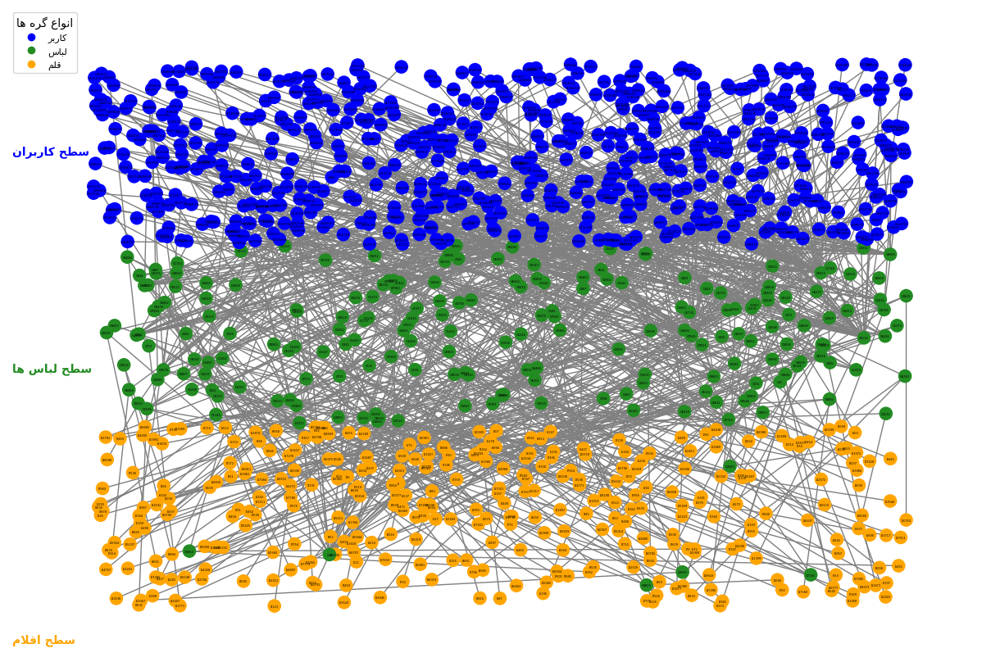

In [ ]:
random.seed(42)

# 1. نمونه‌برداری از داده‌ها برای مقیاس کوچک
sample_item_data = item_data.sample(n=4000, random_state=42)
sample_outfit_data = outfit_data[outfit_data['outfit_id'].isin(
    outfit_data['outfit_id'].sample(n=200, random_state=42)
)].copy()

valid_items1 = set()
for items_str in sample_outfit_data['items']:
    valid_items1.update([int(i) for i in items_str.split(';')])
valid_items1 = valid_items1.intersection(set(sample_item_data['item_id']))

sample_item_data1 = sample_item_data[sample_item_data['item_id'].isin(valid_items1)].copy()

valid_outfits1 = set(sample_outfit_data['outfit_id'])

# def filter_user_outfits(outfits_str):
#     outfits = [int(o) for o in outfits_str.split(';')]
#     filtered = [str(o) for o in outfits if o in valid_outfits]
#     return ';'.join(filtered)
def filter_user_outfits(outfits_str):
    outfits = str(outfits_str).split(';')  # تبدیل به رشته
    filtered = [o for o in outfits if int(o) in valid_outfits1]
    return ';'.join(filtered)


sample_user_data = user_data.copy()
sample_user_data['outfits'] = sample_user_data['outfits'].apply(filter_user_outfits)
sample_user_data = sample_user_data[sample_user_data['outfits'] != '']
sample_user_data = sample_user_data.sample(n=120, random_state=42)


# 1️⃣ Hierarchical Fashion Graph Construction
def build_hierarchical_graph(item_data, outfit_data, user_data):
    G_sample = nx.Graph()

    item_color = 'orange'
    outfit_color = 'forestgreen'
    user_color = 'blue'

    for _, row in item_data.iterrows():
        G_sample.add_node(int(row['item_id']), label=f"I{row['item_id']}", color=item_color)

    for _, row in outfit_data.iterrows():
        outfit_id = int(row['outfit_id'])
        items = [int(i) for i in row['items'].split(';')]
        G_sample.add_node(outfit_id, label=f"O{outfit_id}", color=outfit_color)
        for item in items:
            if item in G_sample.nodes:
                G_sample.add_edge(outfit_id, item)

    for _, row in user_data.iterrows():
        user_id = int(row['user_id'])
        outfits = [int(o) for o in row['outfits'].split(';')]
        G_sample.add_node(user_id, label=f"U{user_id}", color=user_color)
        for outfit in outfits:
            if outfit in G_sample.nodes:
                G_sample.add_edge(user_id, outfit)

    return G_sample


# 2️⃣ Hierarchical Layout Visualization with Random X and Y Positions
def plot_hierarchical_graph(G_sample, item_data, outfit_data, user_data):
    pos = {}

    user_nodes = user_data['user_id'].tolist()
    for user in user_nodes:
        pos[int(user)] = (random.uniform(-2, 2), random.uniform(1, 2))

    outfit_nodes = outfit_data['outfit_id'].tolist()
    for outfit in outfit_nodes:
        pos[int(outfit)] = (random.uniform(-2, 2), random.uniform(0, 1))

    item_nodes = item_data['item_id'].tolist()
    for item in item_nodes:
        pos[int(item)] = (random.uniform(-2, 2), random.uniform(-1, 0))

    node_colors = [G_sample.nodes[node]['color'] for node in G_sample.nodes]
    labels = nx.get_node_attributes(G_sample, 'label')

    plt.figure(figsize=(12, 8))
    nx.draw(G_sample, pos, labels=labels, node_color=node_colors, with_labels=True,
            node_size=120, font_size=2.5, font_color='black', edge_color='gray')
    nx.draw_networkx_edges(G_sample, pos, edgelist=G_sample.edges(), width=0.005, alpha=0.8, edge_color='gray')

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', label=get_display(arabic_reshaper.reshape("کاربر")), markerfacecolor='blue', markersize=8),
        plt.Line2D([0], [0], marker='o', color='w', label=get_display(arabic_reshaper.reshape("لباس")), markerfacecolor='forestgreen', markersize=8),
        plt.Line2D([0], [0], marker='o', color='w', label=get_display(arabic_reshaper.reshape("قلم")), markerfacecolor='orange', markersize=8)
    ]
    plt.legend(handles=legend_elements, loc='upper left', fontsize=8, title=get_display(arabic_reshaper.reshape("انواع گره ها")))

    plt.text(-2.4, 1.5, get_display(arabic_reshaper.reshape("سطح کاربران")), fontsize=10, color='blue', fontweight='bold')
    plt.text(-2.4, 0.3, get_display(arabic_reshaper.reshape("سطح لباس ها")), fontsize=10, color='forestgreen', fontweight='bold')
    plt.text(-2.4, -1.2, get_display(arabic_reshaper.reshape("سطح اقلام")), fontsize=10, color='orange', fontweight='bold')

    plt.show()


# ساخت گراف و ترسیم
G_sample = build_hierarchical_graph(sample_item_data1, sample_outfit_data, sample_user_data)
plot_hierarchical_graph(G_sample, sample_item_data1, sample_outfit_data, sample_user_data)


✅ Save the grap

In [ ]:
import networkx as nx
nx.write_gml(G_sample, data_path+'results/graph/14040318/sample_hierarchical_graph2.gml')  # ذخیره در فرمت GML
nx.write_graphml(G_sample, data_path+'results/graph/14040318/sample_hierarchical_graph2.graphml')  # ذخیره در فرمت GraphML (مناسب برای Gephi)
nx.write_edgelist(G_sample, data_path+'results/graph/14040318/sample_hierarchical_graph2.edgelist', data=False)  # فقط یال‌ها


# Outfit-Item heterogenous graph

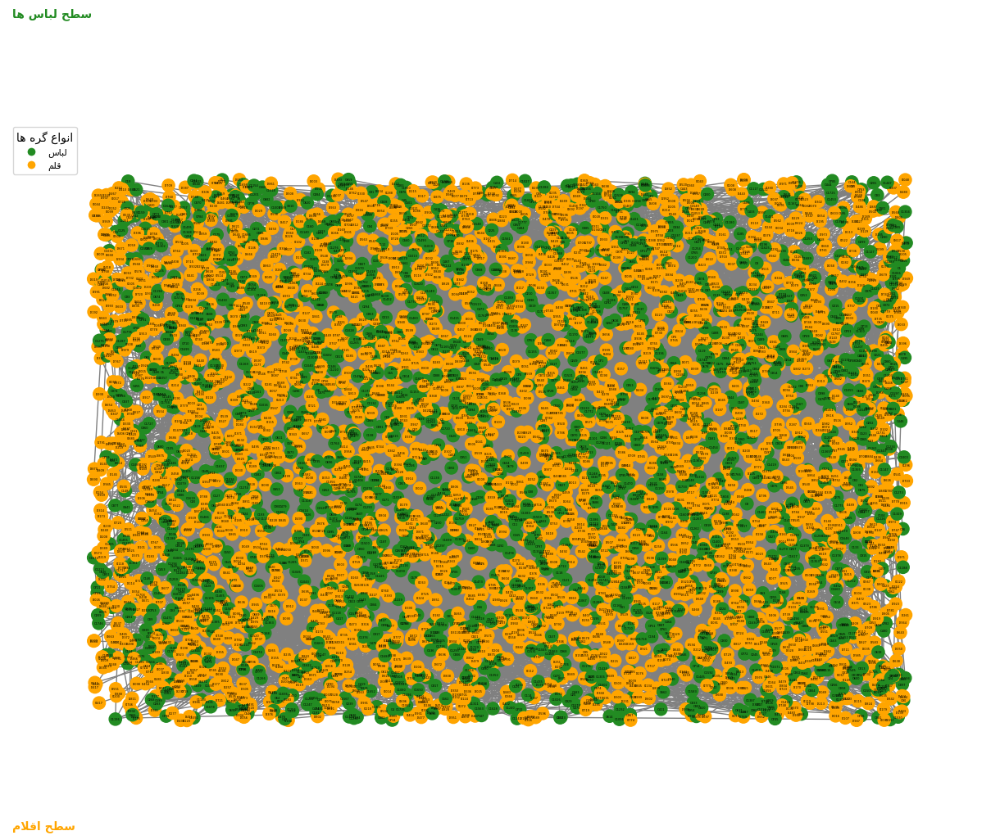

In [ ]:
random.seed(42)

sample_item_data2 = item_data.sample(n=len(item_ids), random_state=42)
sample_outfit_data2 = outfit_data[outfit_data['outfit_id'].isin(
    outfit_data['outfit_id'].sample(n=len(outfit_ids), random_state=42)
)].copy()

valid_items2 = set()
for items_str in sample_outfit_data2['items']:
    valid_items2.update([int(i) for i in items_str.split(';')])
valid_items2 = valid_items2.intersection(set(sample_item_data2['item_id']))

sample_item_data2 = sample_item_data2[sample_item_data2['item_id'].isin(valid_items2)].copy()

valid_outfits2 = set(sample_outfit_data2['outfit_id'])

# 1️⃣ Hierarchical Fashion Graph Construction
def build_hierarchical_graph2(item_data, outfit_data):
    G_sample = nx.Graph()

    item_color = 'orange'
    outfit_color = 'forestgreen'

    for _, row in item_data.iterrows():
        G_sample.add_node(int(row['item_id']), label=f"I{row['item_id']}", color=item_color)

    for _, row in outfit_data.iterrows():
        outfit_id = int(row['outfit_id'])
        items = [int(i) for i in row['items'].split(';')]
        G_sample.add_node(outfit_id, label=f"O{outfit_id}", color=outfit_color)
        for item in items:
            if item in G_sample.nodes:
                G_sample.add_edge(outfit_id, item)

    return G_sample


# 2️⃣ Hierarchical Layout Visualization with Random X and Y Positions
def plot_hierarchical_graph2(G_sample, item_data, outfit_data):
    pos = {}

    outfit_nodes = outfit_data['outfit_id'].tolist()
    for outfit in outfit_nodes:
        pos[int(outfit)] = (random.uniform(-2, 2), random.uniform(0, 1))

    item_nodes = item_data['item_id'].tolist()
    for item in item_nodes:
        pos[int(item)] = (random.uniform(-2, 2), random.uniform(-1, 0))

    node_colors = [G_sample.nodes[node]['color'] for node in G_sample.nodes]
    labels = nx.get_node_attributes(G_sample, 'label')

    plt.figure(figsize=(12, 8))
    nx.draw(G_sample, pos, labels=labels, node_color=node_colors, with_labels=True,
            node_size=120, font_size=2.5, font_color='black', edge_color='gray')
    nx.draw_networkx_edges(G_sample, pos, edgelist=G_sample.edges(), width=0.005, alpha=0.8, edge_color='gray')

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', label=get_display(arabic_reshaper.reshape("لباس")), markerfacecolor='forestgreen', markersize=8),
        plt.Line2D([0], [0], marker='o', color='w', label=get_display(arabic_reshaper.reshape("قلم")), markerfacecolor='orange', markersize=8)
    ]
    plt.legend(handles=legend_elements, loc='upper left', fontsize=8, title=get_display(arabic_reshaper.reshape("انواع گره ها")))

    plt.text(-2.4, 0.3, get_display(arabic_reshaper.reshape("سطح لباس ها")), fontsize=10, color='forestgreen', fontweight='bold')
    plt.text(-2.4, -1.2, get_display(arabic_reshaper.reshape("سطح اقلام")), fontsize=10, color='orange', fontweight='bold')

    plt.show()


# ساخت گراف و ترسیم
G_sample2 = build_hierarchical_graph2(sample_item_data2, sample_outfit_data2)
plot_hierarchical_graph2(G_sample2, sample_item_data2, sample_outfit_data2)


In [ ]:
import networkx as nx
nx.write_gml(G_sample2, data_path+'results/graph/14040318/outfit_item_graph.gml')  # ذخیره در فرمت GML
nx.write_graphml(G_sample2, data_path+'results/graph/14040318/outfit_item_graph.graphml')  # ذخیره در فرمت GraphML (مناسب برای Gephi)
nx.write_edgelist(G_sample2, data_path+'results/graph/14040318/outfit_item_graph.edgelist', data=False)  # فقط یال‌ها

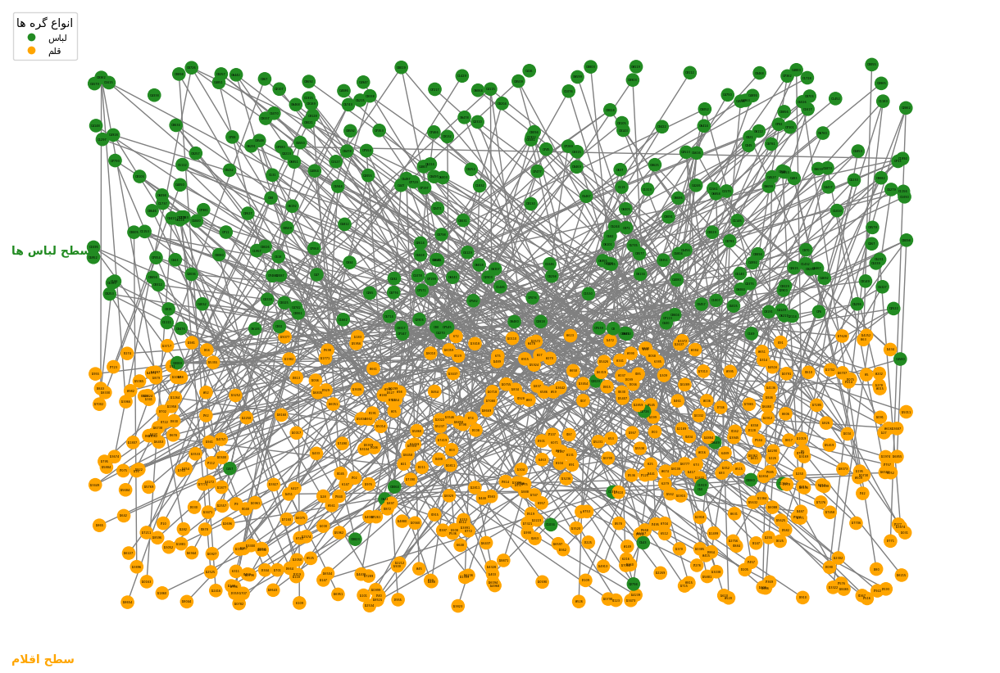

In [ ]:
random.seed(42)

# 1. نمونه‌برداری از داده‌ها برای مقیاس کوچک
sample_item_data2 = item_data.sample(n=9000, random_state=42)
sample_outfit_data2 = outfit_data[outfit_data['outfit_id'].isin(
    outfit_data['outfit_id'].sample(n=300, random_state=42)
)].copy()

valid_items2 = set()
for items_str in sample_outfit_data2['items']:
    valid_items2.update([int(i) for i in items_str.split(';')])
valid_items2 = valid_items2.intersection(set(sample_item_data2['item_id']))

sample_item_data2 = sample_item_data2[sample_item_data2['item_id'].isin(valid_items2)].copy()

valid_outfits2 = set(sample_outfit_data2['outfit_id'])


# 1️⃣ Hierarchical Fashion Graph Construction
def build_hierarchical_graph2(item_data, outfit_data):
    G_sample = nx.Graph()

    item_color = 'orange'
    outfit_color = 'forestgreen'

    for _, row in item_data.iterrows():
        G_sample.add_node(int(row['item_id']), label=f"I{row['item_id']}", color=item_color)

    for _, row in outfit_data.iterrows():
        outfit_id = int(row['outfit_id'])
        items = [int(i) for i in row['items'].split(';')]
        G_sample.add_node(outfit_id, label=f"O{outfit_id}", color=outfit_color)
        for item in items:
            if item in G_sample.nodes:
                G_sample.add_edge(outfit_id, item)

    return G_sample


# 2️⃣ Hierarchical Layout Visualization with Random X and Y Positions
def plot_hierarchical_graph2(G_sample, item_data, outfit_data):
    pos = {}

    outfit_nodes = outfit_data['outfit_id'].tolist()
    for outfit in outfit_nodes:
        pos[int(outfit)] = (random.uniform(-2, 2), random.uniform(0, 1))

    item_nodes = item_data['item_id'].tolist()
    for item in item_nodes:
        pos[int(item)] = (random.uniform(-2, 2), random.uniform(-1, 0))

    node_colors = [G_sample.nodes[node]['color'] for node in G_sample.nodes]
    labels = nx.get_node_attributes(G_sample, 'label')

    plt.figure(figsize=(12, 8))
    nx.draw(G_sample, pos, labels=labels, node_color=node_colors, with_labels=True,
            node_size=120, font_size=2.5, font_color='black', edge_color='gray')
    nx.draw_networkx_edges(G_sample, pos, edgelist=G_sample.edges(), width=0.005, alpha=0.8, edge_color='gray')

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', label=get_display(arabic_reshaper.reshape("لباس")), markerfacecolor='forestgreen', markersize=8),
        plt.Line2D([0], [0], marker='o', color='w', label=get_display(arabic_reshaper.reshape("قلم")), markerfacecolor='orange', markersize=8)
    ]
    plt.legend(handles=legend_elements, loc='upper left', fontsize=8, title=get_display(arabic_reshaper.reshape("انواع گره ها")))

    plt.text(-2.4, 0.3, get_display(arabic_reshaper.reshape("سطح لباس ها")), fontsize=10, color='forestgreen', fontweight='bold')
    plt.text(-2.4, -1.2, get_display(arabic_reshaper.reshape("سطح اقلام")), fontsize=10, color='orange', fontweight='bold')

    plt.show()


# ساخت گراف و ترسیم
G_sample2 = build_hierarchical_graph2(sample_item_data2, sample_outfit_data2)
plot_hierarchical_graph2(G_sample2, sample_item_data2, sample_outfit_data2)


# User-Outfit heterogenous graph

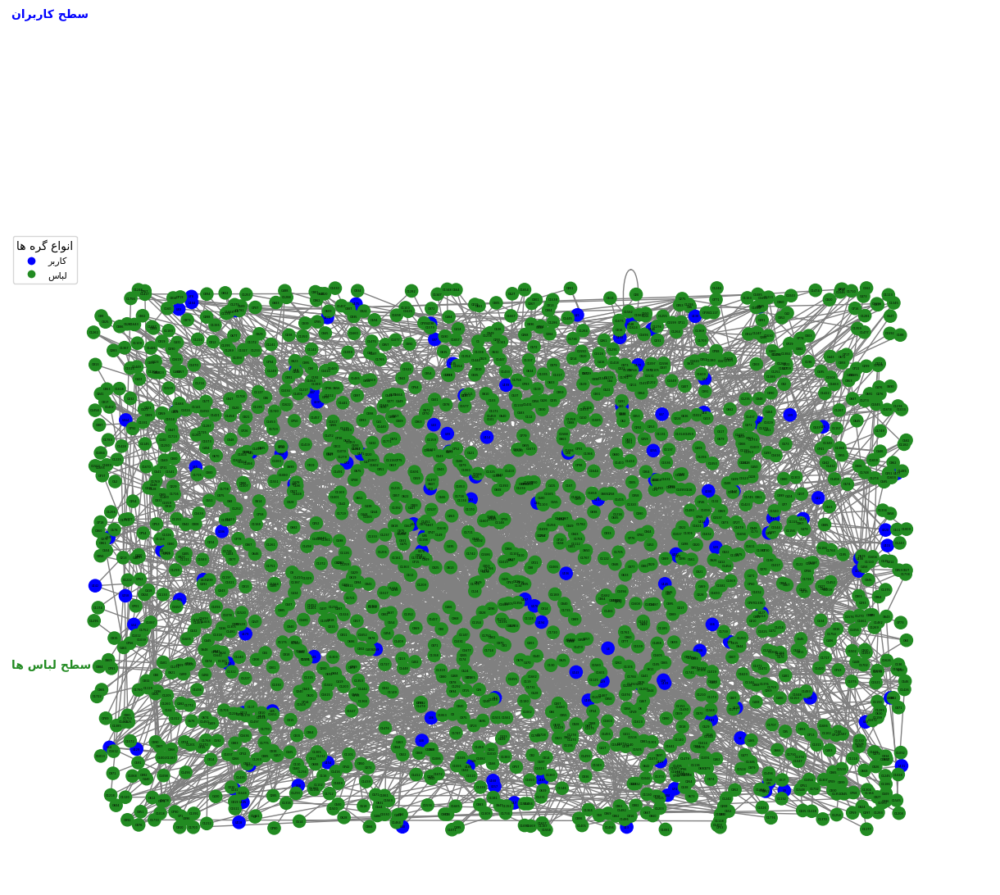

In [ ]:
random.seed(42)

sample_item_data3 = item_data.sample(n=len(item_ids), random_state=42)
sample_outfit_data3 = outfit_data[outfit_data['outfit_id'].isin(
    outfit_data['outfit_id'].sample(n=len(outfit_ids), random_state=42)
)].copy()

valid_items3 = set()
for items_str in sample_outfit_data3['items']:
    valid_items3.update([int(i) for i in items_str.split(';')])
valid_items3 = valid_items3.intersection(set(sample_item_data3['item_id']))

sample_item_data3 = sample_item_data3[sample_item_data3['item_id'].isin(valid_items3)].copy()

valid_outfits3 = set(sample_outfit_data3['outfit_id'])

# def filter_user_outfits(outfits_str):
#     outfits = [int(o) for o in outfits_str.split(';')]
#     filtered = [str(o) for o in outfits if o in valid_outfits]
#     return ';'.join(filtered)
def filter_user_outfits(outfits_str):
    outfits = str(outfits_str).split(';')  # تبدیل به رشته
    filtered = [o for o in outfits if int(o) in valid_outfits3]
    return ';'.join(filtered)


sample_user_data3 = user_data.copy()
sample_user_data3['outfits'] = sample_user_data3['outfits'].apply(filter_user_outfits)
sample_user_data3 = sample_user_data3[sample_user_data3['outfits'] != '']
sample_user_data3 = sample_user_data3.sample(n=len(user_ids), random_state=42)


# 1️⃣ Hierarchical Fashion Graph Construction
def build_hierarchical_graph3(item_data, outfit_data, user_data):
    G_sample = nx.Graph()

    outfit_color = 'forestgreen'
    user_color = 'blue'


    for _, row in outfit_data.iterrows():
        outfit_id = int(row['outfit_id'])
        items = [int(i) for i in row['items'].split(';')]
        G_sample.add_node(outfit_id, label=f"O{outfit_id}", color=outfit_color)
        for item in items:
            if item in G_sample.nodes:
                G_sample.add_edge(outfit_id, item)

    for _, row in user_data.iterrows():
        user_id = int(row['user_id'])
        outfits = [int(o) for o in row['outfits'].split(';')]
        G_sample.add_node(user_id, label=f"U{user_id}", color=user_color)
        for outfit in outfits:
            if outfit in G_sample.nodes:
                G_sample.add_edge(user_id, outfit)

    return G_sample


# 2️⃣ Hierarchical Layout Visualization with Random X and Y Positions
def plot_hierarchical_graph3(G_sample, item_data, outfit_data, user_data):
    pos = {}

    user_nodes = user_data['user_id'].tolist()
    for user in user_nodes:
        pos[int(user)] = (random.uniform(-2, 2), random.uniform(1, 2))

    outfit_nodes = outfit_data['outfit_id'].tolist()
    for outfit in outfit_nodes:
        pos[int(outfit)] = (random.uniform(-2, 2), random.uniform(0, 1))


    node_colors = [G_sample.nodes[node]['color'] for node in G_sample.nodes]
    labels = nx.get_node_attributes(G_sample, 'label')

    plt.figure(figsize=(12, 8))
    nx.draw(G_sample, pos, labels=labels, node_color=node_colors, with_labels=True,
            node_size=120, font_size=2.5, font_color='black', edge_color='gray')
    nx.draw_networkx_edges(G_sample, pos, edgelist=G_sample.edges(), width=0.005, alpha=0.8, edge_color='gray')

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', label=get_display(arabic_reshaper.reshape("کاربر")), markerfacecolor='blue', markersize=8),
        plt.Line2D([0], [0], marker='o', color='w', label=get_display(arabic_reshaper.reshape("لباس")), markerfacecolor='forestgreen', markersize=8),
    ]
    plt.legend(handles=legend_elements, loc='upper left', fontsize=8, title=get_display(arabic_reshaper.reshape("انواع گره ها")))

    plt.text(-2.4, 1.5, get_display(arabic_reshaper.reshape("سطح کاربران")), fontsize=10, color='blue', fontweight='bold')
    plt.text(-2.4, 0.3, get_display(arabic_reshaper.reshape("سطح لباس ها")), fontsize=10, color='forestgreen', fontweight='bold')

    plt.show()


# ساخت گراف و ترسیم
G_sample3 = build_hierarchical_graph3(sample_item_data3, sample_outfit_data3, sample_user_data3)
plot_hierarchical_graph3(G_sample3, sample_item_data3, sample_outfit_data3, sample_user_data3)


In [ ]:
import networkx as nx
nx.write_gml(G_sample3, data_path+'results/graph/14040318/user_outfit_graph.gml')  # ذخیره در فرمت GML
nx.write_graphml(G_sample3, data_path+'results/graph/14040318/user_outfit_graph.graphml')  # ذخیره در فرمت GraphML (مناسب برای Gephi)
nx.write_edgelist(G_sample3, data_path+'results/graph/14040318/user_outfit_graph.edgelist', data=False)  # فقط یال‌ها

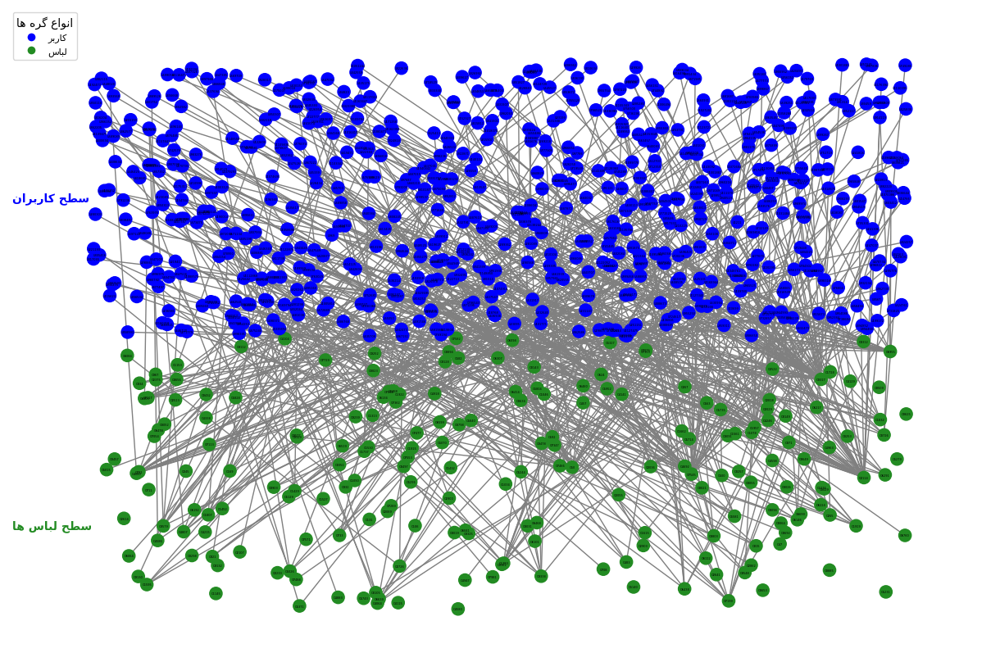

In [ ]:
random.seed(42)

# 1. نمونه‌برداری از داده‌ها برای مقیاس کوچک
sample_item_data3 = item_data.sample(n=9000, random_state=42)
sample_outfit_data3 = outfit_data[outfit_data['outfit_id'].isin(
    outfit_data['outfit_id'].sample(n=200, random_state=42)
)].copy()

valid_items3 = set()
for items_str in sample_outfit_data3['items']:
    valid_items3.update([int(i) for i in items_str.split(';')])
valid_items3 = valid_items3.intersection(set(sample_item_data3['item_id']))

sample_item_data3 = sample_item_data3[sample_item_data3['item_id'].isin(valid_items3)].copy()

valid_outfits3 = set(sample_outfit_data3['outfit_id'])

# def filter_user_outfits(outfits_str):
#     outfits = [int(o) for o in outfits_str.split(';')]
#     filtered = [str(o) for o in outfits if o in valid_outfits]
#     return ';'.join(filtered)
def filter_user_outfits(outfits_str):
    outfits = str(outfits_str).split(';')  # تبدیل به رشته
    filtered = [o for o in outfits if int(o) in valid_outfits3]
    return ';'.join(filtered)


sample_user_data3 = user_data.copy()
sample_user_data3['outfits'] = sample_user_data3['outfits'].apply(filter_user_outfits)
sample_user_data3 = sample_user_data3[sample_user_data3['outfits'] != '']
sample_user_data3 = sample_user_data3.sample(n=600, random_state=42)


# 1️⃣ Hierarchical Fashion Graph Construction
def build_hierarchical_graph3(item_data, outfit_data, user_data):
    G_sample = nx.Graph()

    outfit_color = 'forestgreen'
    user_color = 'blue'


    for _, row in outfit_data.iterrows():
        outfit_id = int(row['outfit_id'])
        items = [int(i) for i in row['items'].split(';')]
        G_sample.add_node(outfit_id, label=f"O{outfit_id}", color=outfit_color)
        for item in items:
            if item in G_sample.nodes:
                G_sample.add_edge(outfit_id, item)

    for _, row in user_data.iterrows():
        user_id = int(row['user_id'])
        outfits = [int(o) for o in row['outfits'].split(';')]
        G_sample.add_node(user_id, label=f"U{user_id}", color=user_color)
        for outfit in outfits:
            if outfit in G_sample.nodes:
                G_sample.add_edge(user_id, outfit)

    return G_sample


# 2️⃣ Hierarchical Layout Visualization with Random X and Y Positions
def plot_hierarchical_graph3(G_sample, item_data, outfit_data, user_data):
    pos = {}

    user_nodes = user_data['user_id'].tolist()
    for user in user_nodes:
        pos[int(user)] = (random.uniform(-2, 2), random.uniform(1, 2))

    outfit_nodes = outfit_data['outfit_id'].tolist()
    for outfit in outfit_nodes:
        pos[int(outfit)] = (random.uniform(-2, 2), random.uniform(0, 1))


    node_colors = [G_sample.nodes[node]['color'] for node in G_sample.nodes]
    labels = nx.get_node_attributes(G_sample, 'label')

    plt.figure(figsize=(12, 8))
    nx.draw(G_sample, pos, labels=labels, node_color=node_colors, with_labels=True,
            node_size=120, font_size=2.5, font_color='black', edge_color='gray')
    nx.draw_networkx_edges(G_sample, pos, edgelist=G_sample.edges(), width=0.005, alpha=0.8, edge_color='gray')

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', label=get_display(arabic_reshaper.reshape("کاربر")), markerfacecolor='blue', markersize=8),
        plt.Line2D([0], [0], marker='o', color='w', label=get_display(arabic_reshaper.reshape("لباس")), markerfacecolor='forestgreen', markersize=8),
    ]
    plt.legend(handles=legend_elements, loc='upper left', fontsize=8, title=get_display(arabic_reshaper.reshape("انواع گره ها")))

    plt.text(-2.4, 1.5, get_display(arabic_reshaper.reshape("سطح کاربران")), fontsize=10, color='blue', fontweight='bold')
    plt.text(-2.4, 0.3, get_display(arabic_reshaper.reshape("سطح لباس ها")), fontsize=10, color='forestgreen', fontweight='bold')

    plt.show()


# ساخت گراف و ترسیم
G_sample3 = build_hierarchical_graph3(sample_item_data3, sample_outfit_data3, sample_user_data3)
plot_hierarchical_graph3(G_sample3, sample_item_data3, sample_outfit_data3, sample_user_data3)


### ✅ 3-3 Embedding Initialization

##### - Download the image of each item using the image url address and save it in the "fashion_item_images" folder.

In [ ]:
import time

# 1️⃣ Loading item data
file_path = "./item_data.txt"
item_data = pd.read_csv(file_path, header=None, names=['item_id', 'category', 'image_url', 'title'])

# Select all items (or a subset if needed)
item_data_sample = item_data.head(len(item_data))  # Or item_data.sample(n=100) for a random sample

# Create a folder to save images
image_dir = "./fashion_item_images/"
os.makedirs(image_dir, exist_ok=True)

# Setting HTTP headers to avoid blocking
headers = {
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/110.0.0.0 Safari/537.36"
}

# 2️⃣ Image download function with response status check and retry
def download_image(image_url, image_id, retries=3):  # Added retry mechanism
    image_path = os.path.join(image_dir, f"{image_id}.png")
    for attempt in range(retries):
        try:
            response = requests.get(image_url, headers=headers, stream=True, timeout=10)
            if response.status_code == 200:
                with open(image_path, 'wb') as file:
                    for chunk in response.iter_content(1024):
                        file.write(chunk)
                print(f"✅ Image {image_id} downloaded successfully (attempt {attempt+1}).")
                return image_path
            else:
                print(f"❌ Failed to download {image_id} (attempt {attempt+1}): HTTP status {response.status_code}")
                time.sleep(5) #Sleep here before retrying
                continue # Retry on failure
        except requests.exceptions.RequestException as e:  # Catch specific exceptions
            print(f"⚠️ Error downloading {image_id} (attempt {attempt+1}): {e}")
            time.sleep(2) #Sleep here before retrying
            continue # Retry on failure

    return None  # Return None if download fails after all retries


# 3️⃣ Download images of all items with sleep
image_paths = {}
for index, row in item_data_sample.iterrows():
    image_url = row["image_url"]
    item_id = row["item_id"]
    image_path = download_image(image_url, item_id)
    if image_path:
        image_paths[item_id] = image_path
    time.sleep(2)  # Sleep after each image download


# Show the path of downloaded images
# image_paths

####
- 3.3.1 Extracting visual features of items
- 3.3.2 Extracting textual features of items

In [ ]:
# 📂 Create a folder to store embeddings
embedding_dir = "./Embedding Initialization/"
os.makedirs(embedding_dir, exist_ok=True)

#1️⃣ Upload item data
file_path = "./item_data.txt"
image_dir = "./all_fashion_item_images/"  # downloadeded images Path

# Embedding storage paths
item_npy_file = os.path.join(embedding_dir, "item_initial_embeddings.npy")
item_csv_file = os.path.join(embedding_dir, "item_initial_embeddings.csv")

item_data = pd.read_csv(file_path, header=None, names=['item_id', 'category', 'image_url', 'title'])

# 2️⃣ Setting the embedding dimensions
D_v = 2048 # ResNet-152 output dimension for visual features
D_t = 768 # Chinese BERT output dimension for text features
D_m = 64 # Final embedding dimension

# 3️⃣ ResNet-152 pre-trained model for visual feature extraction
resnet152 = models.resnet152(pretrained=True)
resnet152 = torch.nn.Sequential(*list(resnet152.children())[:-1])  # Remove the last layer
resnet152.eval()

#4️⃣ Preparing images for processing with ResNet-152
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# 5️⃣ Visual feature extraction function by ResNet-152
def extract_visual_features(image_path):
    try:
        image = Image.open(image_path).convert("RGB")
        image = transform(image).unsqueeze(0)
        with torch.no_grad():
            features = resnet152(image).squeeze().view(-1).numpy().astype(np.float32)  # Convert to float32
        return features
    except Exception as e:
        print(f"⚠️ Error processing image {image_path}: {e}")
        return np.zeros(D_v, dtype=np.float32) # Default value if processing is not correct

# 6️⃣ bert-base-chinese pre-trained model for textual feature extraction
tokenizer = BertTokenizer.from_pretrained("bert-base-chinese")
bert_model = BertModel.from_pretrained("bert-base-chinese")
bert_model.eval()

# 7️⃣ Textual feature extraction function by bert-base-chinese
def extract_text_features(text):
    inputs = tokenizer(text, return_tensors="pt", padding=True, truncation=True, max_length=64)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state[:, 0, :].squeeze().numpy().astype(np.float32) # Vector [CLS] from BERT, Convert to float32

#8️⃣ Fully Connected Layer to combine visual and textual embeddings
class ItemEmbedding(nn.Module):
    def __init__(self, visual_dim=D_v, text_dim=D_t, output_dim=D_m):
        super(ItemEmbedding, self).__init__()
        self.fc = nn.Linear(visual_dim + text_dim, output_dim) # Reduce dimention from 2816 to 256

    def forward(self, visual_features, text_features):
        # Convert all inputs to float32
        visual_features = torch.tensor(visual_features, dtype=torch.float32)
        text_features = torch.tensor(text_features, dtype=torch.float32)

        # Concatenate the features
        combined = torch.cat((visual_features, text_features), dim=0)

        return self.fc(combined).detach().numpy()


# Create an item embedding model
item_embedding_model = ItemEmbedding()

#9️⃣ Extract embeddings for all items
item_embeddings = {}

for index, row in item_data.iterrows():
    item_id = row["item_id"]
    image_path = os.path.join(image_dir, f"{item_id}.png")
    title = row["title"]

    if os.path.exists(image_path):  # Check if the image exists
        visual_features = extract_visual_features(image_path)
    else:
        visual_features = np.zeros(D_v)  # Default value if no image exists

    text_features = extract_text_features(title) if pd.notna(title) else np.zeros(D_t)

   # concatenate embeds
    final_embedding = item_embedding_model(visual_features, text_features)
    item_embeddings[item_id] = final_embedding


np.save(item_npy_file, item_embeddings)
embeddings_list = [[item_id] + embedding.tolist() for item_id, embedding in item_embeddings.items()]
columns = ["item_id"] + [f"dim_{i}" for i in range(D_m)]
df_embeddings = pd.DataFrame(embeddings_list, columns=columns)
df_embeddings.to_csv(item_csv_file, index=False, encoding="utf-8")
print(f"✅ Item embeds saved: {item_csv_file}")

# 🔟 🔹 **Embedding users and outfits** 🔹
user_data_file = "./user_data.txt"
outfit_data_file = "./outfit_data.txt"
user_npy_file = os.path.join(embedding_dir, "user_initial_embeddings.npy")
user_csv_file = os.path.join(embedding_dir, "user_initial_embeddings.csv")
outfit_npy_file = os.path.join(embedding_dir, "outfit_initial_embeddings.npy")
outfit_csv_file = os.path.join(embedding_dir, "outfit_initial_embeddings.csv")
user_data = pd.read_csv(user_data_file, header=None, names=['user_id', 'items', 'outfits'])
outfit_data = pd.read_csv(outfit_data_file, header=None, names=['outfit_id', 'items'])

# Extract unique IDs
unique_users = user_data['user_id'].unique()
unique_outfits = outfit_data['outfit_id'].unique()

# 🔹Random embeds for users and outfits🔹
user_embeddings = {user_id: np.random.uniform(-0.1, 0.1, D_m) for user_id in unique_users}
outfit_embeddings = {outfit_id: np.random.uniform(-0.1, 0.1, D_m) for outfit_id in unique_outfits}

np.save(user_npy_file, user_embeddings)
np.save(outfit_npy_file, outfit_embeddings)
def save_embeddings_to_csv(embeddings, file_name):
    embeddings_list = [[entity_id] + embedding.tolist() for entity_id, embedding in embeddings.items()]
    columns = ["id"] + [f"dim_{i}" for i in range(D_m)]
    df = pd.DataFrame(embeddings_list, columns=columns)
    df.to_csv(file_name, index=False, encoding="utf-8")

save_embeddings_to_csv(user_embeddings, user_csv_file)
save_embeddings_to_csv(outfit_embeddings, outfit_csv_file)
print(f"✅ User and outfit embeddings saved in: {embedding_dir}")
example_user = list(user_embeddings.keys())[0]
print(f"🔹 Example embedding of user {example_user}: \n{user_embeddings[example_user]}")


In [ ]:
duplicate_item_ids = item_data[item_data['item_id'].duplicated()]
print(f"تعداد item_id های تکراری: {duplicate_item_ids.shape[0]}")


تعداد item_id های تکراری: 0


### ✅ 3.4 information propagating and updating embeddings with self-attention mechanism

#### 3-4-1 Information Propagation between items

#### • Creating a uniform category graph

##### 1 --> Calculating the degree of co-occurrence of pair categories in outfit

In [ ]:
item_data['category']

,category
0,3
1,10
2,43
3,16
4,46
...,...
19170,15
19171,5
19172,26
19173,51


In [ ]:
from collections import defaultdict

# تبدیل item_id به string
item_data['item_id'] = item_data['item_id'].astype(str)
item_category_map = dict(zip(item_data['item_id'], item_data['category']))

category_cooccurrence = defaultdict(int)
category_count = defaultdict(int)

for _, row in outfit_data.iterrows():
    items = [item.strip() for item in row['items'].split(';')]
    categories = list(set(item_category_map[item] for item in items if item in item_category_map))

    for c in categories:
        category_count[c] += 1

    for i in range(len(categories)):
        for j in range(i + 1, len(categories)):
            category_cooccurrence[(categories[i], categories[j])] += 1
            category_cooccurrence[(categories[j], categories[i])] += 1

print("✅ The co-occurrence of pair categories in outfit was calculated!")

# نمونه‌ای از نتایج:
print("\nنمونه‌ای از category_count:")
for k, v in list(category_count.items())[:10]:
    print(f"{k}: {v}")

print("\nنمونه‌ای از category_cooccurrence:")
for k, v in list(category_cooccurrence.items())[:10]:
    print(f"{k}: {v}")


✅ The co-occurrence of pair categories in outfit was calculated!

نمونه‌ای از category_count:
10: 2285
12: 244
46: 2118
56: 458
1: 905
29: 578
3: 624
5: 4710
43: 2028
23: 5953

نمونه‌ای از category_cooccurrence:
(10, 12): 81
(12, 10): 81
(10, 46): 577
(46, 10): 577
(12, 46): 68
(46, 12): 68
(56, 1): 350
(1, 56): 350
(56, 29): 184
(29, 56): 184


## Categories Scatter plot

<ipython-input-37-ab3a682af0d8>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=category_counts1, x='Category', y='Count', palette='viridis')


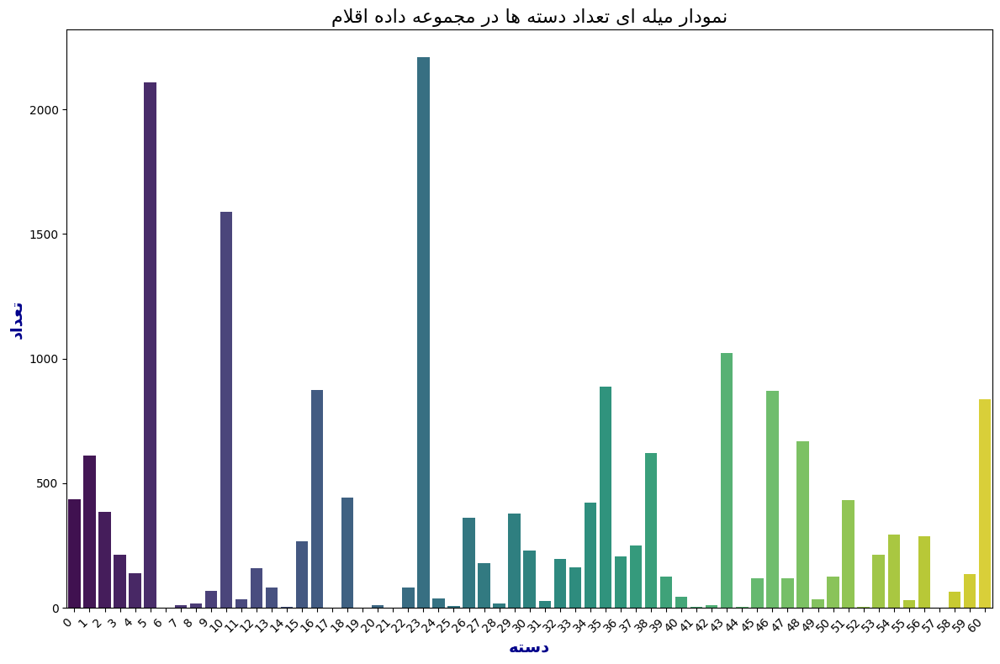

تعداد کل دسته‌ها: 61

نمونه‌ای از تعداد دسته‌ها:
23: 2209
5: 2108
10: 1590
43: 1021
35: 886
16: 873
46: 871
60: 838
48: 668
38: 621


<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os

# محاسبه تعداد هر دسته‌بندی
category_counts1 = item_data['category'].value_counts().reset_index()
category_counts1.columns = ['Category', 'Count']

# تنظیمات برای رسم
plt.figure(figsize=(12, 8))
sns.barplot(data=category_counts1, x='Category', y='Count', palette='viridis')

# تنظیمات محورها و عنوان
plt.title(get_display(arabic_reshaper.reshape("نمودار میله ای تعداد دسته ها در مجموعه داده اقلام")), fontsize=16, color='black')
plt.xlabel(get_display(arabic_reshaper.reshape("دسته")), fontsize=14,color='darkblue', fontweight='bold')
plt.ylabel(get_display(arabic_reshaper.reshape("تعداد")), fontsize=14, color='darkblue', fontweight='bold')
plt.xticks(rotation=45, ha='right')

# نمایش نمودار
plt.tight_layout()
plt.show()

# چاپ آمار
data_path='/content/drive/MyDrive/HHFGAT_project/hierarchical_fashion_graph_network/Data/pog/'
Output_dir1 = data_path + 'results/graph/'
os.makedirs(Output_dir1, exist_ok=True)
plt.savefig(os.path.join(Output_dir1, 'category_counts_bar.png'), dpi=300, bbox_inches='tight')
("✅ نمودار میله‌ای برای تعداد دسته‌بندی‌ها رسم شد!")
print(f"تعداد کل دسته‌ها: {len(category_counts1)}")
print("\nنمونه‌ای از تعداد دسته‌ها:")
for _, row in category_counts1.head(10).iterrows():
    print(f"{row['Category']}: {row['Count']}")

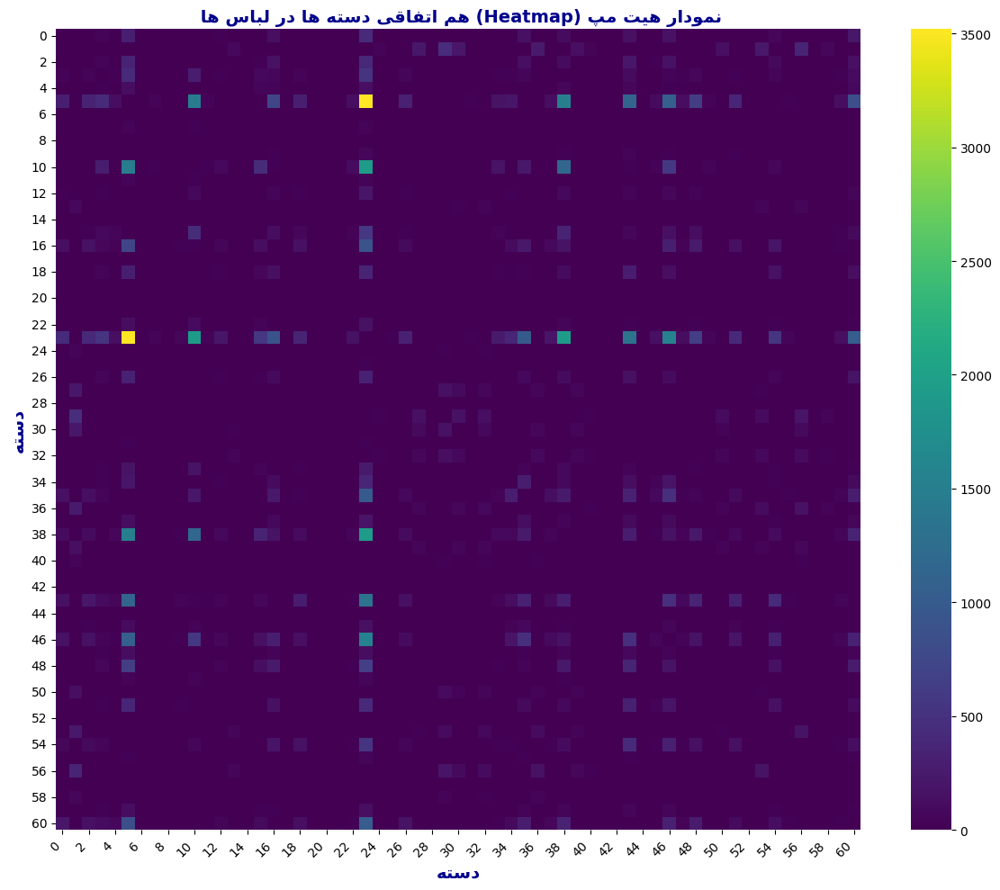

✅ نقشه حرارتی برای هم‌رخدادی دسته‌بندی‌ها رسم شد!
تعداد کل دسته‌بندی‌ها: 61
تعداد کل جفت‌های هم‌رخدادی: 1090


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
from arabic_reshaper import arabic_reshaper
from matplotlib.font_manager import FontProperties

# تنظیم فونت B Nazanin
font_name = 'B Nazanin'
font_prop = FontProperties(family=font_name)

# فرض می‌کنیم category_cooccurrence از قبل محاسبه شده است
# تبدیل به ماتریس هم‌رخدادی
categories = sorted(set(cat for pair in category_cooccurrence.keys() for cat in pair))
cooccurrence_matrix = pd.DataFrame(0, index=categories, columns=categories)
for (cat1, cat2), count in category_cooccurrence.items():
    cooccurrence_matrix.loc[cat1, cat2] = count

# رسم heatmap بدون نمایش اعداد
plt.figure(figsize=(12, 10))
sns.heatmap(cooccurrence_matrix, annot=False, cmap='viridis')

# تنظیمات محورها و عنوان با فونت B Nazanin
plt.title(get_display(arabic_reshaper.reshape("نمودار هیت مپ (Heatmap) هم اتفاقی دسته ها در لباس ها ")), fontsize=14,color='darkblue', fontweight='bold')
plt.xlabel(get_display(arabic_reshaper.reshape("دسته")), fontsize=14,color='darkblue', fontweight='bold')
plt.ylabel(get_display(arabic_reshaper.reshape("دسته")), fontsize=14,color='darkblue', fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# ذخیره و نمایش نمودار
plt.tight_layout()
output_dir = data_path + 'results/graph/'
os.makedirs(output_dir, exist_ok=True)
plt.savefig(os.path.join(output_dir, 'category_cooccurrence_heatmap.png'), dpi=300, bbox_inches='tight')
plt.show()

# چاپ آمار
print("✅ نقشه حرارتی برای هم‌رخدادی دسته‌بندی‌ها رسم شد!")
print(f"تعداد کل دسته‌بندی‌ها: {len(categories)}")
print(f"تعداد کل جفت‌های هم‌رخدادی: {len(category_cooccurrence)}")

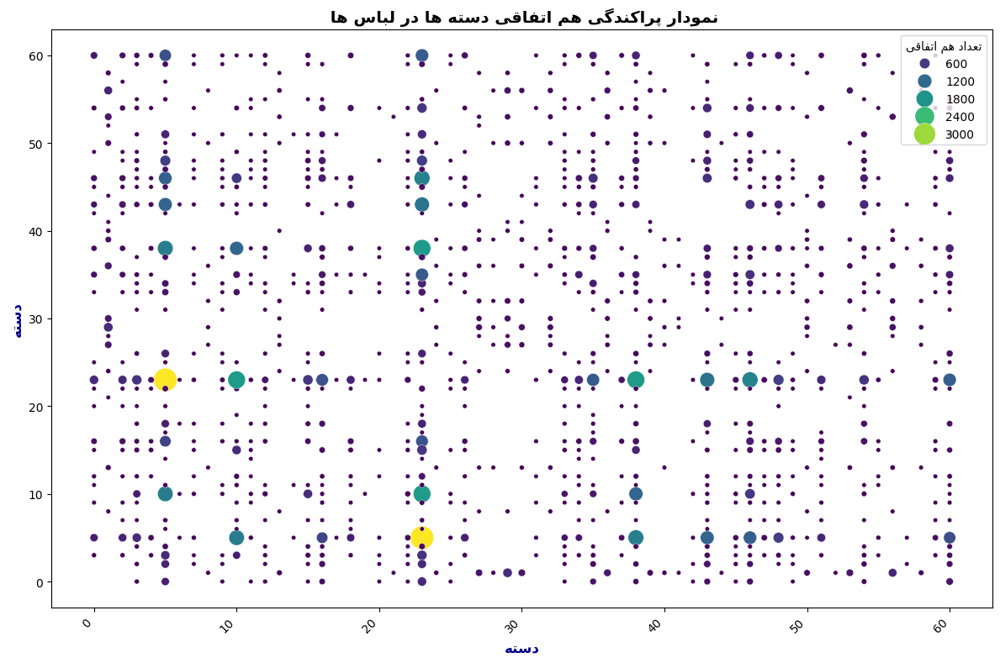

✅ Scatter plot برای هم‌رخدادی دسته‌بندی‌ها رسم شد!
تعداد کل جفت‌های دسته‌بندی: 1090

نمونه‌ای از category_count:
10: 2285
12: 244
46: 2118
56: 458
1: 905
29: 578
3: 624
5: 4710
43: 2028
23: 5953

نمونه‌ای از category_cooccurrence:
(10, 12): 81
(12, 10): 81
(10, 46): 577
(46, 10): 577
(12, 46): 68
(46, 12): 68
(56, 1): 350
(1, 56): 350
(56, 29): 184
(29, 56): 184


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from collections import defaultdict

# فرض می‌کنیم item_data و outfit_data از قبل بارگذاری شده‌اند
# item_data['item_id'] = item_data['item_id'].astype(str)
# item_category_map = dict(zip(item_data['item_id'], item_data['category']))

# محاسبه هم‌رخدادی دسته‌بندی‌ها
category_cooccurrence_1 = defaultdict(int)
category_count_1 = defaultdict(int)

for _, row in outfit_data.iterrows():
    items = [item.strip() for item in row['items'].split(';')]
    categories = list(set(item_category_map[item] for item in items if item in item_category_map))

    for c in categories:
        category_count_1[c] += 1

    for i in range(len(categories)):
        for j in range(i + 1, len(categories)):
            category_cooccurrence_1[(categories[i], categories[j])] += 1
            category_cooccurrence_1[(categories[j], categories[i])] += 1

# تبدیل داده‌های هم‌رخدادی به DataFrame برای رسم
cooccurrence_data_1 = []
for (cat1, cat2), count in category_cooccurrence_1.items():
    cooccurrence_data_1.append({'Category1': cat1, 'Category2': cat2, 'Cooccurrence': count})

df_cooccurrence_1 = pd.DataFrame(cooccurrence_data_1)

# تنظیمات برای رسم
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df_cooccurrence_1, x='Category1', y='Category2', size='Cooccurrence', hue='Cooccurrence', palette='viridis', sizes=(15, 400))

# تنظیمات محورها و عنوان
plt.title(get_display(arabic_reshaper.reshape("نمودار پراکندگی هم اتفاقی دسته ها در لباس ها ")), fontsize=14,color='black', fontweight='bold')
plt.xlabel(get_display(arabic_reshaper.reshape("دسته")), fontsize=12,color='darkblue', fontweight='bold')
plt.ylabel(get_display(arabic_reshaper.reshape("دسته")), fontsize=12,color='darkblue', fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.legend(title=get_display(arabic_reshaper.reshape("تعداد هم اتفاقی")), loc='best')

# نمایش نمودار
plt.tight_layout()
plt.show()

# چاپ آمار
print("✅ Scatter plot برای هم‌رخدادی دسته‌بندی‌ها رسم شد!")
print(f"تعداد کل جفت‌های دسته‌بندی: {len(cooccurrence_data_1)}")
print("\nنمونه‌ای از category_count:")
for k, v in list(category_count_1.items())[:10]:
    print(f"{k}: {v}")
print("\nنمونه‌ای از category_cooccurrence:")
for k, v in list(category_cooccurrence_1.items())[:10]:
    print(f"{k}: {v}")

In [ ]:
len(category_count)

61

##### 2 --> Calculate the edge weights based on formula (3-6)
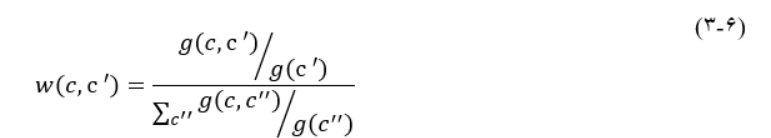 ![image.png](attachment:image.png)


In [ ]:
# 3️⃣ Calculating the weight of edges between categories
category_weights = {}

# Copy keys and values ​​to a list to prevent dictionary size from changing
category_cooccurrence_list = list(category_cooccurrence.items())

for (c1, c2), g_cc in category_cooccurrence_list:
    g_c = category_count[c1]  # g(c)
    denominator = sum(category_cooccurrence.get((c1, c), 0) / category_count.get(c, 1) for c in category_count.keys())
    weight = (g_cc / g_c) / denominator if denominator != 0 else 0
    category_weights[(c1, c2)] = weight

print("✅the weight of edges between categories was calculated!")
# نمایش چند نمونه وزن
print("\nنمونه‌ای از وزن یال‌ها بین دسته‌ها:")
for (c1, c2), w in list(category_weights.items())[:10]:
    print(f"({c1}, {c2}): {w:.4f}")

✅the weight of edges between categories was calculated!

نمونه‌ای از وزن یال‌ها بین دسته‌ها:
(10, 12): 0.0041
(12, 10): 0.3778
(10, 46): 0.0295
(46, 10): 0.0381
(12, 46): 0.3171
(46, 12): 0.0045
(56, 1): 0.1750
(1, 56): 0.0280
(56, 29): 0.0920
(29, 56): 0.0522


In [ ]:
category_weights

{(10, 12): 0.00414341057282676,
 (12, 10): 0.3777788234407555,
 (10, 46): 0.029515406179272105,
 (46, 10): 0.03813194662669352,
 (12, 46): 0.31714765424656016,
 (46, 12): 0.0044938862575652685,
 (56, 1): 0.17498699102307563,
 (1, 56): 0.02797347371387936,
 (56, 29): 0.09199316099498833,
 (29, 56): 0.05216428800165837,
 (1, 29): 0.03548634951132125,
 (29, 1): 0.12587469496052348,
 (3, 5): 0.34685512660018025,
 (5, 3): 0.00421702767557641,
 (3, 43): 0.08443728618906536,
 (43, 3): 0.005266179891704346,
 (3, 23): 0.4379149450393684,
 (23, 3): 0.003102273490721754,
 (3, 26): 0.038907376969471295,
 (26, 3): 0.082974221585685,
 (5, 43): 0.011332632846537084,
 (43, 5): 0.05813449566724601,
 (5, 23): 0.03541699377172646,
 (23, 5): 0.020636862786105582,
 (5, 26): 0.0032508351771149894,
 (26, 5): 0.5702270972803458,
 (43, 23): 0.06923477681152479,
 (23, 43): 0.007864175332812614,
 (43, 26): 0.007641123764433757,
 (26, 43): 0.26128052754641234,
 (23, 26): 0.0018648827411144003,
 (26, 23): 0.561400

### Normalize category_weights using Min-Max normalization (scaling to range [0, 1])

In [ ]:
### Normalize category_weights using Min-Max normalization (scaling to range [0, 1])
# Step 1: Extract all weights
all_weights = list(category_weights.values())

# Step 2: Compute min and max
min_weight = min(all_weights)
max_weight = max(all_weights)

# Step 3: Apply Min-Max normalization
normalized_category_weights = {
    key: (value - min_weight) / (max_weight - min_weight) if max_weight != min_weight else 0.0
    for key, value in category_weights.items()
}

# Optional: Print results
for key, value in normalized_category_weights.items():
    print(f"{key}: {value:.6f}")


(10, 12): 0.000006
(12, 10): 0.000504
(10, 46): 0.000039
(46, 10): 0.000051
(12, 46): 0.000423
(46, 12): 0.000006
(56, 1): 0.000234
(1, 56): 0.000037
(56, 29): 0.000123
(29, 56): 0.000070
(1, 29): 0.000047
(29, 1): 0.000168
(3, 5): 0.000463
(5, 3): 0.000006
(3, 43): 0.000113
(43, 3): 0.000007
(3, 23): 0.000584
(23, 3): 0.000004
(3, 26): 0.000052
(26, 3): 0.000111
(5, 43): 0.000015
(43, 5): 0.000078
(5, 23): 0.000047
(23, 5): 0.000028
(5, 26): 0.000004
(26, 5): 0.000761
(43, 23): 0.000092
(23, 43): 0.000010
(43, 26): 0.000010
(26, 43): 0.000349
(23, 26): 0.000002
(26, 23): 0.000749
(18, 60): 0.000158
(60, 18): 0.000022
(18, 5): 0.000385
(5, 18): 0.000004
(18, 23): 0.000454
(23, 18): 0.000003
(60, 5): 0.000149
(5, 60): 0.000011
(60, 23): 0.000180
(23, 60): 0.000008
(43, 46): 0.000033
(46, 43): 0.000042
(43, 48): 0.000024
(48, 43): 0.000171
(43, 54): 0.000029
(54, 43): 0.000212
(46, 48): 0.000015
(48, 46): 0.000083
(46, 54): 0.000027
(54, 46): 0.000156
(46, 23): 0.000137
(23, 46): 0.00001

In [ ]:
normalized_category_weights

{(10, 12): 5.521482016878798e-06,
 (12, 10): 0.0005041313179917636,
 (10, 46): 3.9379960447982285e-05,
 (46, 10): 5.087858095127593e-05,
 (12, 46): 0.0004232200973586988,
 (46, 12): 5.989185606159355e-06,
 (56, 1): 0.00023350921201229882,
 (1, 56): 3.732227890288317e-05,
 (56, 29): 0.00012275541686317717,
 (29, 56): 6.960449180006362e-05,
 (1, 29): 4.734807849267286e-05,
 (29, 1): 0.00016796972340725325,
 (3, 5): 0.0004628641926647901,
 (5, 3): 5.619722735672559e-06,
 (3, 43): 0.00011267223585870498,
 (43, 3): 7.0197977724066885e-06,
 (3, 23): 0.00058438190638299,
 (23, 3): 4.1321030344341006e-06,
 (3, 26): 5.1913378999605045e-05,
 (26, 3): 0.00011071980207756872,
 (5, 43): 1.5115371715842557e-05,
 (43, 5): 7.757162811090063e-05,
 (5, 23): 4.725552448747877e-05,
 (23, 5): 2.7531701657460545e-05,
 (5, 26): 4.330355971745658e-06,
 (26, 5): 0.0007609501283830747,
 (43, 23): 9.238475655111177e-05,
 (23, 43): 1.0486776640419877e-05,
 (43, 26): 1.0189118275893721e-05,
 (26, 43): 0.0003486664

In [ ]:
# Extract values from dictionary
values_normalized = list(normalized_category_weights.values())

# Find 5 maximum values
max_values_normalized = sorted(values_normalized, reverse=True)[:5]

# Find 5 minimum values
min_values_normalized = sorted(values_normalized)[:5]

# Print results
print("5 Maximum Normalized Values:")
for i, val in enumerate(max_values_normalized, 1):
    print(f"{i}. {val}")

print("\n5 Minimum Normalized Values:")
for i, val in enumerate(min_values_normalized, 1):
    print(f"{i}. {val}")

5 Maximum Normalized Values:
1. 1.0
2. 1.0
3. 1.0
4. 0.47506089604124063
5. 0.47506089604124063

5 Minimum Normalized Values:
1. 0.0
2. 0.0
3. 0.0
4. 5.604951074173979e-09
5. 5.604951074173979e-09


In [ ]:
import numpy as np
from scipy.sparse import dok_matrix
import scipy.sparse as sp
import pandas as pd

def create_and_save_cooccurrence_matrix(normalized_category_weights, output_npz_path, output_csv_path):
    # استخراج cate_idهای یکتا
    unique_cate_ids = set()
    for (cate_id1, cate_id2) in normalized_category_weights.keys():
        unique_cate_ids.add(cate_id1)
        unique_cate_ids.add(cate_id2)

    # تبدیل به لیست مرتب‌شده برای اندیس‌گذاری
    unique_cate_ids = sorted(unique_cate_ids)
    n_categories = len(unique_cate_ids)

    print(n_categories)

    # ایجاد ماتریس sparse با نوع dok_matrix
    cooccurrence_matrix = dok_matrix((n_categories, n_categories), dtype=np.float64)

    # ایجاد دیکشنری برای نگاشت cate_id به اندیس ماتریس
    cate_id_to_index = {cate_id: idx for idx, cate_id in enumerate(unique_cate_ids)}

    # پر کردن ماتریس با وزن‌های نرمال‌شده
    for (cate_id1, cate_id2), weight in normalized_category_weights.items():
        i = cate_id_to_index[cate_id1]
        j = cate_id_to_index[cate_id2]
        cooccurrence_matrix[i, j] = weight

    # ذخیره ماتریس در فرمت .npz
    sp.save_npz(output_npz_path, cooccurrence_matrix.tocsr())

    # تبدیل ماتریس به فرمت dense برای ذخیره در CSV
    dense_matrix = cooccurrence_matrix.toarray()
    df = pd.DataFrame(dense_matrix, index=unique_cate_ids, columns=unique_cate_ids)

    # ذخیره ماتریس در فرمت .csv
    df.to_csv(output_csv_path)

# مثال استفاده
if __name__ == "__main__":
    normalized_category_weights

    # مسیرهای خروجی
    output_npz_path = data_path + 'results/matrix/category_cooccurrence_matrix.npz'
    output_csv_path = data_path + 'results/matrix/category_cooccurrence_matrix.csv'

    # اجرای تابع
    create_and_save_cooccurrence_matrix(normalized_category_weights, output_npz_path, output_csv_path)

61


##### 4 --> construction weighted categories graph

In [ ]:
# 4️⃣ Creating category graph
category_graph = nx.Graph()

# Add nodes related to categories
for category in category_count.keys():
    category_graph.add_node(category, label=f"C_{category}")

# Adding edges with normalized weights
for (c1, c2), weight in normalized_category_weights.items():
    if weight > 0:  # Only add edges with positive normalized weight
        category_graph.add_edge(c1, c2, weight=weight)

print(f"✅ Category graph created! Number of nodes: {category_graph.number_of_nodes()} and number of edges: {category_graph.number_of_edges()}")


✅ Category graph created! Number of nodes: 61 and number of edges: 545


##### 5 --> Visualize the category graph

✅ Graph structure saved to results/graph/category_cooccurrence_matrix..gexf


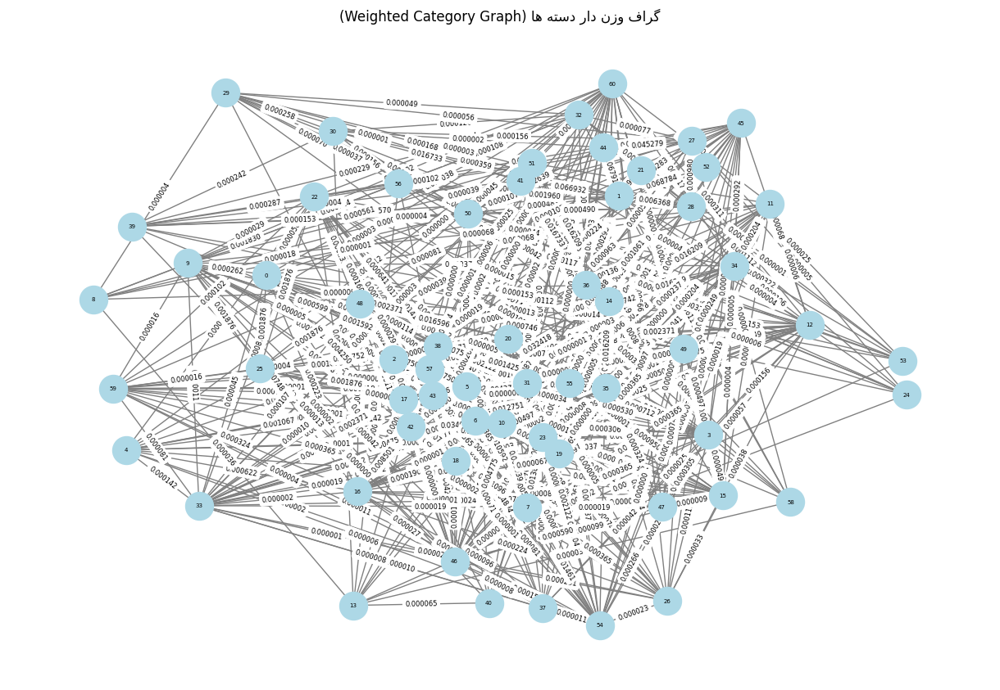

In [ ]:
##### 5 --> Visualize the category graph
# 5️⃣ Plotting the uniform categories graph with normalized weights
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(category_graph, seed=42)

nx.draw(
    category_graph,
    pos,
    with_labels=True,
    node_color='lightblue',
    edge_color='gray',
    node_size=600,
    font_size=5
)

# Use normalized weights for edge labels
edge_labels = {(c1, c2): f"{weight:.6f}" for (c1, c2), weight in normalized_category_weights.items() if category_graph.has_edge(c1, c2)}

nx.draw_networkx_edge_labels(category_graph, pos, edge_labels=edge_labels, font_size=6)
nx.write_gexf(category_graph, data_path+'results/graph/category_cooccurrence_matrix..gexf')
print(f"✅ Graph structure saved to results/graph/category_cooccurrence_matrix..gexf")

plt.title(get_display(arabic_reshaper.reshape("گراف وزن دار دسته ها (Weighted Category Graph)")))
plt.show()


##### 6 --> Display the top 5 pairs of categories with highest co-occurrence in outfits

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

image_dir = "./all_fashion_item_images/"

# 6️⃣ Get pairs of categories sorted by highest normalized weight
sorted_category_pairs = sorted(normalized_category_weights.items(), key=lambda x: x[1], reverse=True)

# 7️⃣ Function to find the first associated with a category that has an image
def get_item_with_image(category):
    items_in_category = item_data[item_data['category'] == category]

    for _, item_row in items_in_category.iterrows():
        item_id = item_row['item_id']
        image_path = os.path.join(image_dir, f"{item_id}.png")
        if os.path.exists(image_path):
            return item_id, image_path
    return None, None

# 8️⃣ Find 5 valid pairs where both items have images
valid_pairs = []
added_categories = set()

for (c1, c2), weight in sorted_category_pairs:
    if c1 in added_categories or c2 in added_categories:
        continue

    item1_id, img1_path = get_item_with_image(c1)
    item2_id, img2_path = get_item_with_image(c2)

    if item1_id and item2_id:
        valid_pairs.append(((c1, c2), (item1_id, img1_path), (item2_id, img2_path)))
        added_categories.update([c1, c2])

    if len(valid_pairs) == 5:
        break

# 9️⃣ Display images with the category and item ID
fig, axes = plt.subplots(len(valid_pairs), 2, figsize=(10, 12))

for i, ((c1, c2), (item1_id, img1_path), (item2_id, img2_path)) in enumerate(valid_pairs):
    # Load and display the first image
    img1 = Image.open(img1_path)
    axes[i, 0].imshow(img1)
    axes[i, 0].axis("off")
    axes[i, 0].set_title(f"category: {c1}\nitem_id: {item1_id}", fontsize=5, fontweight="bold", color="darkblue")

    # Load and display the second image
    img2 = Image.open(img2_path)
    axes[i, 1].imshow(img2)
    axes[i, 1].axis("off")
    axes[i, 1].set_title(f"category: {c2}\nitem_id: {item2_id}", fontsize=5, fontweight="bold", color="darkred")

# Adjust the distance between images
plt.tight_layout()
plt.show()


#### • Creating item subgraphs for each outfit

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd

# 1️⃣ Limit to first 10 outfits
# outfit_subset = outfit_data.head(10)
outfit_subset = outfit_data

# 2️⃣ Create item subgraphs for each outfit with normalized weights
outfit_item_graphs = {}

for _, row in outfit_subset.iterrows():
    outfit_id = row['outfit_id']
    items = row['items'].split(';')

    # Get unique categories in this outfit
    categories = list(set(item_data[item_data['item_id'].isin(items)]['category']))

    # Create a subgraph of items with nodes corresponding to the categories of that outfit
    go_graph = nx.Graph()
    for item in items:
        item_row = item_data[item_data['item_id'] == item]
        if not item_row.empty:
            category = item_row['category'].values[0]
            go_graph.add_node(item, category=category)

    for i in range(len(items)):
        for j in range(i + 1, len(items)):
            item1_row = item_data[item_data['item_id'] == items[i]]
            item2_row = item_data[item_data['item_id'] == items[j]]
            if not item1_row.empty and not item2_row.empty:
                cat1 = item1_row['category'].values[0]
                cat2 = item2_row['category'].values[0]
                if category_graph.has_edge(cat1, cat2):
                    # Use normalized_category_weights here:
                    weight = normalized_category_weights.get(
                        (cat1, cat2),
                        normalized_category_weights.get((cat2, cat1), 0.1)
                    )
                    go_graph.add_edge(items[i], items[j], weight=weight)

    outfit_item_graphs[outfit_id] = go_graph


In [ ]:
len(outfit_item_graphs)

9373

KeyboardInterrupt: 

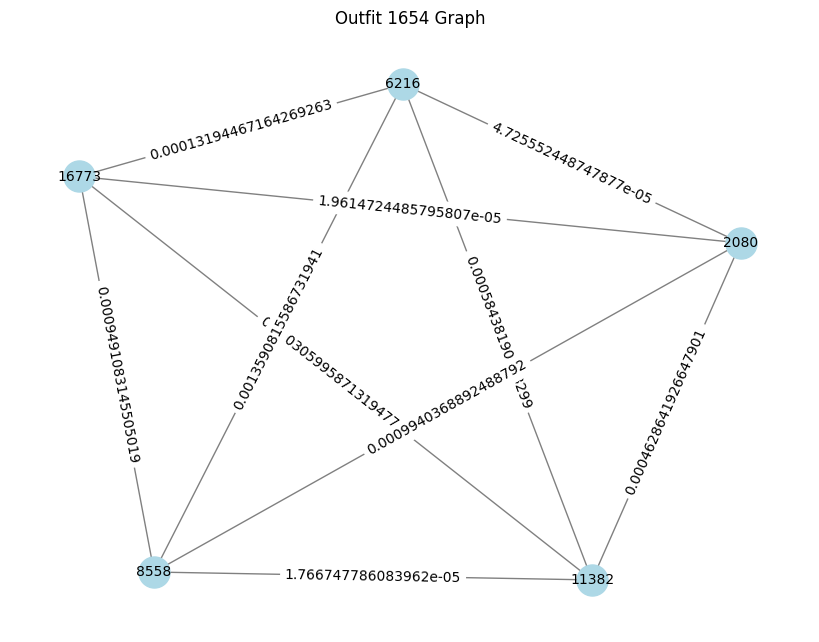

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
from scipy.sparse import dok_matrix, save_npz
import numpy as np
import os

outfit_subset2 = outfit_data
outfit_item_graphs2 = {}

for _, row in outfit_subset2.iterrows():
    outfit_id = row['outfit_id']
    items = row['items'].split(';')

    # دریافت دسته‌بندی‌های منحصربه‌فرد در این outfit
    categories = list(set(item_data[item_data['item_id'].isin(items)]['category']))

    # ایجاد زیرگراف آیتم‌ها
    go_graph = nx.Graph()
    for item in items:
        item_row = item_data[item_data['item_id'] == item]
        if not item_row.empty:
            category = item_row['category'].values[0]
            go_graph.add_node(item, category=category)

    for i in range(len(items)):
        for j in range(i + 1, len(items)):
            item1_row = item_data[item_data['item_id'] == items[i]]
            item2_row = item_data[item_data['item_id'] == items[j]]
            if not item1_row.empty and not item2_row.empty:
                cat1 = item1_row['category'].values[0]
                cat2 = item2_row['category'].values[0]
                if category_graph.has_edge(cat1, cat2):
                    weight = normalized_category_weights.get(
                        (cat1, cat2),
                        normalized_category_weights.get((cat2, cat1), 0.1)
                    )
                    go_graph.add_edge(items[i], items[j], weight=weight)

    outfit_item_graphs2[outfit_id] = go_graph

# ۲. ذخیره گراف‌ها به‌صورت تصویر PNG و فرمت GEXF برای Gephi
png_output_dir = data_path + 'results/graph/outfit_graphs/png/'
gexf_output_dir = data_path + 'results/graph/outfit_graphs/gexf/'
os.makedirs(png_output_dir, exist_ok=True)  # ایجاد پوشه اگر وجود نداشته باشد
os.makedirs(gexf_output_dir, exist_ok=True)  # ایجاد پوشه اگر وجود نداشته باشد

for outfit_id, graph in outfit_item_graphs2.items():
    # ذخیره به‌صورت تصویر PNG
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(graph)  # چیدمان گراف
    nx.draw(graph, pos, with_labels=True, node_color='lightblue',
            edge_color='gray', node_size=500, font_size=10)
    edge_labels = nx.get_edge_attributes(graph, 'weight')
    nx.draw_networkx_edge_labels(graph, pos, edge_labels=edge_labels)
    plt.title(f"Outfit {outfit_id} Graph")
    plt.savefig(f"{png_output_dir}/outfit_{outfit_id}.png", format="png", dpi=300)
    plt.close()

    # ذخیره به‌صورت GEXF برای Gephi
    nx.write_gexf(graph, f"{gexf_output_dir}/outfit_{outfit_id}.gexf")

# ۳. ایجاد ماتریس اسپارس آیتم-آیتم با dok_matrix
# دریافت لیست منحصربه‌فرد آیتم‌ها
all_items2 = list(item_data['item_id'].unique())
n_items2 = len(all_items2)
item_to_index2 = {item: idx for idx, item in enumerate(all_items2)}

# ایجاد ماتریس اسپارس با استفاده از dok_matrix
item_item_matrix2 = dok_matrix((n_items2, n_items2), dtype=np.float32)

# پر کردن ماتریس با وزن‌های یال‌ها
for graph in outfit_item_graphs2.values():
    for u, v, data in graph.edges(data=True):
        i = item_to_index2[u]
        j = item_to_index2[v]
        weight = data['weight']
        item_item_matrix2[i, j] = weight
        item_item_matrix2[j, i] = weight  # چون گراف جهت‌دار نیست

# تبدیل به فرمت CSR برای بهینه‌سازی ذخیره‌سازی و محاسبات
item_item_matrix2 = item_item_matrix2.tocsr()

# ذخیره ماتریس اسپارس
save_npz(data_path + 'results/matrix/item_item_matrix.npz', item_item_matrix2)

print(f"گراف‌ها در پوشه {png_output_dir}  ,{gexf_output_dir} به‌صورت PNG و GEXF ذخیره شدند.")
print(f"ماتریس اسپارس آیتم-آیتم با ابعاد {n_items2}x{n_items2} با dok_matrix ایجاد و ذخیره شد.")

In [ ]:
#  ایجاد ماتریس اسپارس آیتم-آیتم با dok_matrix
# دریافت لیست منحصربه‌فرد آیتم‌ها
all_items2 = list(item_data['item_id'].unique())
n_items2 = len(all_items2)
item_to_index2 = {item: idx for idx, item in enumerate(all_items2)}

# ایجاد ماتریس اسپارس با استفاده از dok_matrix
item_item_matrix2 = dok_matrix((n_items2, n_items2), dtype=np.float32)

# پر کردن ماتریس با وزن‌های یال‌ها
for graph in outfit_item_graphs2.values():
    for u, v, data in graph.edges(data=True):
        i = item_to_index2[u]
        j = item_to_index2[v]
        weight = data['weight']
        item_item_matrix2[i, j] = weight
        item_item_matrix2[j, i] = weight  # چون گراف جهت‌دار نیست

# تبدیل به فرمت CSR برای بهینه‌سازی ذخیره‌سازی و محاسبات
item_item_matrix2 = item_item_matrix2.tocsr()

# ذخیره ماتریس اسپارس
save_npz(data_path + 'results/matrix/item_item_matrix.npz', item_item_matrix2)

In [ ]:
import numpy as np
from scipy.sparse import load_npz
import pandas as pd


item_item_matrix3 = load_npz(data_path + 'results/matrix/item_item_matrix.npz')

# ۲. بررسی ابعاد ماتریس
matrix_shape = item_item_matrix3.shape
print(f"ابعاد ماتریس: {matrix_shape}")


all_items3 = list(item_data['item_id'].unique())
item_to_index3 = {item: idx for idx, item in enumerate(all_items3)}
index_to_item3 = {idx: item for item, idx in item_to_index3.items()}

# ۴. تبدیل ماتریس به فرمت COO برای دسترسی به درایه‌های غیرصفر
coo_matrix = item_item_matrix3.tocoo()
non_zero_indices = [(i, j) for i, j, w in zip(coo_matrix.row, coo_matrix.col, coo_matrix.data) if w > 0]


selected_indices = set()
for i, j in non_zero_indices:
    selected_indices.add(i)
    selected_indices.add(j)
    if len(selected_indices) >= 5:
        break

selected_indices = list(selected_indices)[:5]
if len(selected_indices) < 5:
    print("تعداد اندیس‌های غیرصفر کافی نیست. تعداد اندیس‌های موجود:", len(selected_indices))

# ۶. استخراج زیرماتریس ۵x۵
submatrix = item_item_matrix3[selected_indices, :][:, selected_indices].todense()

# ۷. نگاشت اندیس‌ها به item_id برای برچسب‌گذاری
selected_items = [index_to_item3[idx] for idx in selected_indices]

# ۸. نمایش زیرماتریس به‌صورت DataFrame برای خوانایی
submatrix_df = pd.DataFrame(submatrix, index=selected_items, columns=selected_items)
print("\nزیرماتریس ۵x۵ با وزن‌های غیرصفر:")
print(submatrix_df)

# ۹. نمایش درایه‌های غیرصفر به‌صورت لیست (اختیاری)
print("\nدرایه‌های غیرصفر در زیرماتریس:")
for i in range(len(selected_indices)):
    for j in range(len(selected_indices)):
        if submatrix[i, j] > 0:
            print(f"({selected_items[i]}, {selected_items[j]}) -> وزن: {submatrix[i, j]}")

ابعاد ماتریس: (19175, 19175)

زیرماتریس ۵x۵ با وزن‌های غیرصفر:
              0         1      3920     16733      7484
0      0.000000  0.000000  0.000007  0.000000  0.000004
1      0.000000  0.000000  0.000000  0.000079  0.000000
3920   0.000007  0.000000  0.000000  0.000000  0.000143
16733  0.000000  0.000079  0.000000  0.000000  0.000000
7484   0.000004  0.000000  0.000143  0.000000  0.000000

درایه‌های غیرصفر در زیرماتریس:
(0, 3920) -> وزن: 7.290223038580734e-06
(0, 7484) -> وزن: 4.132103185838787e-06
(1, 16733) -> وزن: 7.897253817645833e-05
(3920, 0) -> وزن: 7.290223038580734e-06
(3920, 7484) -> وزن: 0.00014259605086408556
(16733, 1) -> وزن: 7.897253817645833e-05
(7484, 0) -> وزن: 4.132103185838787e-06
(7484, 3920) -> وزن: 0.00014259605086408556


In [ ]:
# ۱. بارگذاری ماتریس اسپارس و تبدیل به COO
coo_matrix = item_item_matrix3.tocoo()

# ۲. ساخت DataFrame از درایه‌های غیرصفر
df_weights = pd.DataFrame({
    'row': coo_matrix.row,
    'col': coo_matrix.col,
    'weight': coo_matrix.data
})


top5 = df_weights.sort_values(by='weight', ascending=False).head(10)

# ۴. نگاشت اندیس‌ها به item_id
top5['row_item'] = top5['row'].map(index_to_item3)
top5['col_item'] = top5['col'].map(index_to_item3)

# ۵. نمایش نتایج
print("🔝 10 درایه با بیشترین وزن:")
for _, row in top5.iterrows():
    print(f"({row['row_item']}, {row['col_item']}) -> وزن: {row['weight']}")


🔝 10 درایه با بیشترین وزن:
(7325, 18421) -> وزن: 1.0
(18421, 7325) -> وزن: 1.0
(5688, 12383) -> وزن: 0.40751805901527405
(12383, 5688) -> وزن: 0.40751805901527405
(9062, 12383) -> وزن: 0.20375902950763702
(12383, 1081) -> وزن: 0.20375902950763702
(12383, 9062) -> وزن: 0.20375902950763702
(1081, 12383) -> وزن: 0.20375902950763702
(17869, 5001) -> وزن: 0.17502593994140625
(5001, 17869) -> وزن: 0.17502593994140625


In [ ]:
for outfit_id, g in outfit_item_graphs.items():
    print("outfit_id: ",outfit_id, "g:",g)

outfit_id:  0 g: Graph with 3 nodes and 3 edges
outfit_id:  1 g: Graph with 3 nodes and 3 edges
outfit_id:  2 g: Graph with 5 nodes and 10 edges
outfit_id:  3 g: Graph with 4 nodes and 6 edges
outfit_id:  4 g: Graph with 5 nodes and 10 edges
outfit_id:  5 g: Graph with 4 nodes and 6 edges
outfit_id:  6 g: Graph with 3 nodes and 3 edges
outfit_id:  7 g: Graph with 3 nodes and 3 edges
outfit_id:  8 g: Graph with 4 nodes and 6 edges
outfit_id:  9 g: Graph with 5 nodes and 10 edges
outfit_id:  10 g: Graph with 4 nodes and 6 edges
outfit_id:  11 g: Graph with 5 nodes and 10 edges
outfit_id:  12 g: Graph with 3 nodes and 3 edges
outfit_id:  13 g: Graph with 3 nodes and 3 edges
outfit_id:  14 g: Graph with 3 nodes and 3 edges
outfit_id:  15 g: Graph with 4 nodes and 6 edges
outfit_id:  16 g: Graph with 4 nodes and 6 edges
outfit_id:  17 g: Graph with 5 nodes and 10 edges
outfit_id:  18 g: Graph with 4 nodes and 6 edges
outfit_id:  19 g: Graph with 4 nodes and 6 edges
outfit_id:  20 g: Graph w

✅ Item subgraphs created for the first 10 outfits!

🔹 Outfit: 0 - Categories: {np.int64(10), np.int64(12), np.int64(46)}
  Edges and Weights:
  - 15843 ↔ 245, Weight: 0.000051
  - 15843 ↔ 5923, Weight: 0.000006
  - 245 ↔ 5923, Weight: 0.000006

🔹 Outfit: 1 - Categories: {np.int64(56), np.int64(1), np.int64(29)}
  Edges and Weights:
  - 891 ↔ 5964, Weight: 0.000123
  - 891 ↔ 4403, Weight: 0.000234
  - 5964 ↔ 4403, Weight: 0.000168

🔹 Outfit: 2 - Categories: {np.int64(3), np.int64(5), np.int64(43), np.int64(23), np.int64(26)}
  Edges and Weights:
  - 2243 ↔ 5098, Weight: 0.000006
  - 2243 ↔ 4258, Weight: 0.000047
  - 2243 ↔ 6052, Weight: 0.000015
  - 2243 ↔ 435, Weight: 0.000004
  - 5098 ↔ 4258, Weight: 0.000584
  - 5098 ↔ 6052, Weight: 0.000113
  - 5098 ↔ 435, Weight: 0.000052
  - 4258 ↔ 6052, Weight: 0.000010
  - 4258 ↔ 435, Weight: 0.000002
  - 6052 ↔ 435, Weight: 0.000010

🔹 Outfit: 3 - Categories: {np.int64(18), np.int64(60), np.int64(5), np.int64(23)}
  Edges and Weights:
  - 2650 

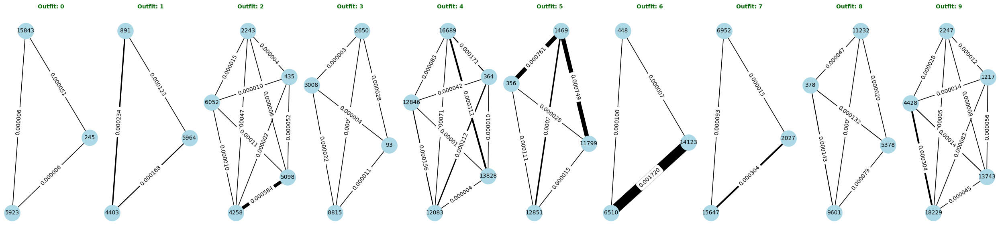

In [ ]:
print("✅ Item subgraphs created for the first 10 outfits!")

# 3️⃣ Show sample info for the first 5 of the 10 outfits
sample_outfits2 = list(outfit_item_graphs.keys())[:10]
total_outfit_node_count = 0
total_outfit_edge_count = 0

for outfit_id in sample_outfits2:
    go_graph = outfit_item_graphs[outfit_id]
    categories = set(nx.get_node_attributes(go_graph, "category").values())

    print(f"\n🔹 Outfit: {outfit_id} - Categories: {categories}")
    print("  Edges and Weights:")
    for edge in go_graph.edges(data=True):
        print(f"  - {edge[0]} ↔ {edge[1]}, Weight: {edge[2]['weight']:.6f}")

# 4️⃣ Plotting weighted edge subgraphs
fig, axes = plt.subplots(1, len(sample_outfits2), figsize=(25, 6))

for i, outfit_id in enumerate(sample_outfits2):
    ax = axes[i]
    go_graph = outfit_item_graphs[outfit_id]
    pos = nx.spring_layout(go_graph, seed=42)

    edges = go_graph.edges(data=True)
    # weights = [edge[2]['weight'] * 10 for edge in edges]  # scale edge thickness
    weights = [max(edge[2]['weight'] * 10000, 1.2) for edge in edges]

    nx.draw(go_graph, pos, with_labels=True, ax=ax, node_color='lightblue',
            edge_color='black', node_size=800, font_size=10, width=weights)

    edge_labels = {(edge[0], edge[1]): f"{edge[2]['weight']:.6f}" for edge in edges}
    nx.draw_networkx_edge_labels(go_graph, pos, edge_labels=edge_labels, font_size=10, ax=ax)

    ax.set_title(f"Outfit: {outfit_id}", fontsize=10, color="darkgreen", fontweight="bold")
    total_outfit_node_count += go_graph.number_of_nodes()
    total_outfit_edge_count += go_graph.number_of_edges()

plt.tight_layout()
plt.show()

In [ ]:
list(outfit_item_graphs[2])

['2243', '5098', '4258', '6052', '435']

##### 6 --> Display the top 5 pairs of categories with highest co-occurrence in outfits

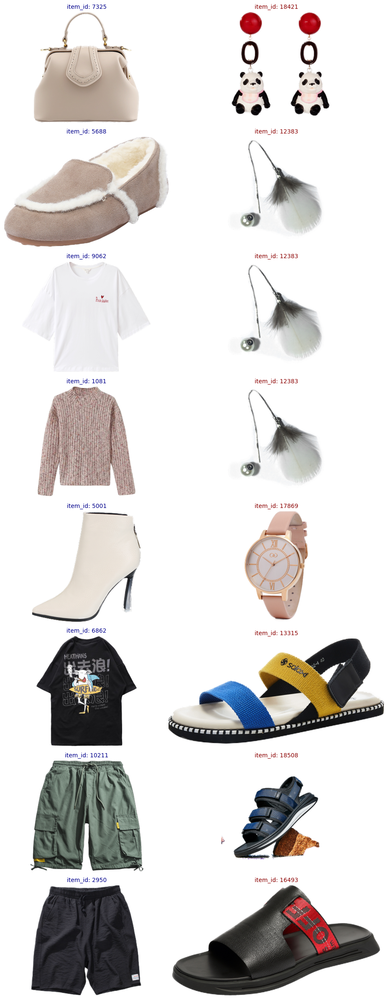

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import pandas as pd
from scipy.sparse import load_npz

data_path='/content/drive/MyDrive/HHFGAT_project/hierarchical_fashion_graph_network/Data/pog/'

item_item_matrix = load_npz(data_path + 'results/matrix/item_item_matrix.npz')
coo = item_item_matrix.tocoo()


df_weights = pd.DataFrame({
    'row': coo.row,
    'col': coo.col,
    'weight': coo.data
})

df_weights = df_weights[df_weights['row'] < df_weights['col']]
df_top5 = df_weights.sort_values(by='weight', ascending=False).drop_duplicates(subset=['row', 'col']).head(9)

# df_top5 = df_weights.sort_values(by='weight', ascending=False).drop_duplicates(subset=['row', 'col']).head(5)


all_items = list(item_data['item_id'].unique())
index_to_item = {idx: item_id for idx, item_id in enumerate(all_items)}

image_dir = data_path + 'item_pic_new_id/'

valid_pairs = []
for _, row in df_top5.iterrows():
    item1_id = index_to_item.get(row['row'])
    item2_id = index_to_item.get(row['col'])

    img1_path = os.path.join(image_dir, f"{item1_id}.png")
    img2_path = os.path.join(image_dir, f"{item2_id}.png")

    if os.path.exists(img1_path) and os.path.exists(img2_path):
        valid_pairs.append((item1_id, img1_path, item2_id, img2_path))


if len(valid_pairs) == 0:
    print("هیچ جفت آیتمی با عکس یافت نشد. لطفاً مسیر عکس‌ها یا نام فایل‌ها را بررسی کن.")
else:
    # اگر جفت‌های معتبر داریم، نمایش بده
    fig, axes = plt.subplots(len(valid_pairs), 2, figsize=(10, 3 * len(valid_pairs)))

    for i, (item1_id, img1_path, item2_id, img2_path) in enumerate(valid_pairs):
        # Image 1
        img1 = Image.open(img1_path)
        axes[i, 0].imshow(img1)
        axes[i, 0].axis("off")
        axes[i, 0].set_title(f"item_id: {item1_id}", fontsize=10, color="darkblue")

        # Image 2
        img2 = Image.open(img2_path)
        axes[i, 1].imshow(img2)
        axes[i, 1].axis("off")
        axes[i, 1].set_title(f"item_id: {item2_id}", fontsize=10, color="darkred")

    plt.tight_layout()
    plt.show()



In [ ]:
data_path='/content/drive/MyDrive/HHFGAT_project/hierarchical_fashion_graph_network/Data/pog/'


# FGAT model implementation

In [ ]:
!pip install torch-scatter -f https://data.pyg.org/whl/torch-2.6.0+cu124.html

Looking in links: https://data.pyg.org/whl/torch-2.6.0+cu124.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 41.3 MB/s eta 0:00:00


In [ ]:
!pip install seaborn

In [ ]:
!pip install --upgrade matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 88.5 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.10.0
    Uninstalling matplotlib-3.10.0:
      Successfully uninstalled matplotlib-3.10.0


### import libraries

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.metrics import roc_auc_score
import numpy as np
import pandas as pd
import os
import scipy.sparse as sp
from torch.utils.data import Dataset, DataLoader
from torch_scatter import scatter
from torch_scatter import scatter_add
from torch.utils.data import Dataset
import random
from torch.utils.data import DataLoader
import time
import matplotlib.pyplot as plt
import seaborn

### Dataset for Outfit Recomendation Task

In [ ]:
# ---------------------------
# Outfit Recommendation Dataset
# ---------------------------
class OutfitRecommendationDataset(Dataset):
    def __init__(self, train_file, item_data, outfit_data, user_data,
                 item_embeddings_file, outfit_embeddings_file, user_embeddings_file,
                 max_items_per_outfit=10):
        self.user_outfits = []
        self.max_items_per_outfit = max_items_per_outfit

        item_data.columns = item_data.columns.str.strip()
        outfit_data.columns = outfit_data.columns.str.strip()
        user_data.columns = user_data.columns.str.strip()

        item_data['item_id'] = item_data['item_id'].astype(int)
        outfit_data['outfit_id'] = outfit_data['outfit_id'].astype(int)
        user_data['user_id'] = user_data['user_id'].astype(int)

        with open(train_file, 'r') as f:
            for line in f:
                parts = line.strip().split()
                user_id = int(parts[0])
                outfit_ids = list(map(int, parts[1:]))
                for outfit_id in outfit_ids:
                    self.user_outfits.append((user_id, outfit_id))

        self.user2id = {uid: idx for idx, uid in enumerate(user_data['user_id'].unique())}
        self.outfit2id = {oid: idx for idx, oid in enumerate(outfit_data['outfit_id'].unique())}
        self.item2id = {int(iid): idx for idx, iid in enumerate(item_data['item_id'].unique())}

        self.user_embeddings = torch.tensor(np.load(user_embeddings_file)[:, 1:], dtype=torch.float32)
        self.outfit_embeddings = torch.tensor(np.load(outfit_embeddings_file)[:, 1:], dtype=torch.float32)
        self.item_embeddings = torch.tensor(np.load(item_embeddings_file)[:, 1:], dtype=torch.float32)

        self.item_data = item_data.set_index('item_id')
        self.outfit_data = outfit_data.set_index('outfit_id')

    def __len__(self):
        return len(self.user_outfits)

    def __getitem__(self, idx):
        user_id, outfit_id = self.user_outfits[idx]
        user_idx = self.user2id.get(user_id, -1)
        outfit_idx = self.outfit2id.get(outfit_id, -1)

        item_indices = []
        if outfit_id in self.outfit_data.index:
            try:
                item_ids = list(map(int, self.outfit_data.loc[outfit_id, 'items'].split(';')))
                for item in item_ids:
                    item_indices.append(self.item2id.get(item, -1))
            except:
                item_indices = [-1] * self.max_items_per_outfit
        else:
            item_indices = [-1] * self.max_items_per_outfit

        if self.max_items_per_outfit:
            item_indices = item_indices[:self.max_items_per_outfit]
            item_indices += [-1] * (self.max_items_per_outfit - len(item_indices))

        return {
            'user_idx': torch.tensor(user_idx, dtype=torch.long),
            'outfit_idx': torch.tensor(outfit_idx, dtype=torch.long),
            'item_indices': torch.tensor(item_indices, dtype=torch.long)
        }

### Dataset for compatibility task

In [ ]:
# ---------------------------
# Outfit Compatibilty Dataset
# ---------------------------
# import re
# CompatibilityDataset (retained from previous fix)

# # CompatibilityDataset (retained from previous fix)
# class CompatibilityDataset(Dataset):
#     def __init__(self, file_path, item2id, max_items=10):
#         self.item2id = item2id
#         self.max_items = max_items
#         self.samples = []
#         with open(file_path, 'r') as file:
#             for line_idx, line in enumerate(file):
#                 try:
#                     ids = re.split('[;,]', line.strip())
#                     if len(ids) < 2:
#                         print(f"Skipping malformed line {line_idx}: {line.strip()}")
#                         continue
#                     pos_ids, *neg_ids = map(int, ids)
#                     pos_ids = [self.item2id.get(pos_id, -1) for pos_id in [pos_ids]]
#                     neg_ids = [self.item2id.get(neg_id, -1) for neg_id in neg_ids]
#                     if -1 in pos_ids or -1 in neg_ids:
#                         print(f"Skipping line {line_idx} with invalid IDs: {line.strip()}")
#                         continue
#                     pos_ids = pos_ids + [-1] * (max_items - len(pos_ids))
#                     neg_ids = neg_ids + [-1] * (max_items - len(neg_ids))
#                     self.samples.append({'pos': pos_ids, 'neg': neg_ids})
#                 except ValueError as e:
#                     print(f"Error parsing line {line_idx}: {line.strip()} - {e}")
#                     continue
#     def __len__(self):
#         return len(self.samples)
#     def __getitem__(self, idx):
#         sample = self.samples[idx]
#         return {
#             'pos_item_indices': torch.tensor(sample['pos'], dtype=torch.long),
#             'neg_item_indices': torch.tensor(sample['neg'], dtype=torch.long)
#         }

class CompatibilityDataset(Dataset):
    def __init__(self, file_path, item2id, max_items=10):
        self.samples = []
        self.item2id = item2id
        self.max_items = max_items

        with open(file_path, 'r') as f:
            for line in f:
                parts = line.strip().split(';')
                if len(parts) < 5:
                    continue
                outfit_len = int(parts[1])
                mask_pos = int(parts[2])
                pos_outfit = parts[3].split(',')
                neg_outfits = [p.split(',') for p in parts[4:]]

                pos_ids = [item2id.get(int(i), -1) for i in pos_outfit]
                neg_ids_list = [[item2id.get(int(i), -1) for i in neg] for neg in neg_outfits]

                if all(i == -1 for i in pos_ids):
                    continue
                if all(all(i == -1 for i in neg) for neg in neg_ids_list):
                    continue

                self.samples.append({
                    'pos': pos_ids,
                    'neg': neg_ids_list[0]
                })

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        pos = self.samples[idx]['pos']
        neg = self.samples[idx]['neg']

        pos += [-1] * (self.max_items - len(pos))
        neg += [-1] * (self.max_items - len(neg))

        pos = pos[:self.max_items]
        neg = neg[:self.max_items]

        return {
            'pos_item_indices': torch.tensor(pos, dtype=torch.long),
            'neg_item_indices': torch.tensor(neg, dtype=torch.long)
        }

### class MultiHeadSelfAttentionLayer

In [ ]:
# ---------------------------
# MultiHeadSelfAttentionLayer Class
# ---------------------------
class MultiHeadSelfAttentionLayer(nn.Module):
    def __init__(self, in_dim, out_dim, num_heads, dropout=0.2):
        super().__init__()
        self.num_heads = num_heads
        self.head_dim = out_dim // num_heads
        self.out_dim = out_dim

        self.W = nn.Linear(in_dim, out_dim, bias=False)
        #----------------------------------------------------
        self.bn = nn.BatchNorm1d(out_dim)
        #----------------------------------------------------
        self.attn = nn.Parameter(torch.Tensor(num_heads, 2 * self.head_dim))
        nn.init.xavier_uniform_(self.attn.data, gain=1.414)

        self.leakyrelu = nn.LeakyReLU(0.2)
        self.dropout = nn.Dropout(dropout)

    def forward(self, h, edge_index, edge_weight=None):
        Wh = self.W(h).view(-1, self.num_heads, self.head_dim)  # [N, heads, head_dim]
        #----------------------------------------------------
        Wh = Wh.view(-1, self.out_dim)  # Reshape for batch norm: [N, out_dim]
        Wh = self.bn(Wh).view(-1, self.num_heads, self.head_dim)  # Apply batch norm and reshape back
        #----------------------------------------------------
        row, col = edge_index

        Wh_row = Wh[row]
        Wh_col = Wh[col]

        att_input = torch.cat([Wh_row, Wh_col], dim=-1)  # [E, heads, 2*head_dim]
        e = self.leakyrelu((att_input * self.attn).sum(dim=-1))  # [E, heads]

        if edge_weight is not None:
            e = e * edge_weight.unsqueeze(-1)

        alpha = F.softmax(e, dim=0)
        alpha = self.dropout(alpha)

        messages = alpha.unsqueeze(-1) * Wh_row  # [E, heads, head_dim]
        # h_prime = scatter_add(messages, col, dim=0, dim_size=h.size(0))  # [N, heads, head_dim]
        # return h_prime.view(-1, self.out_dim)
        #----------------------------------------------------
        h_prime = scatter_add(messages, col, dim=0, dim_size=h.size(0))  # [N, heads, head_dim]
        h_prime = h_prime.view(-1, self.out_dim)
        h_prime = self.bn(h_prime)  # Apply batch normalization to final output
        return h_prime
        #----------------------------------------------------

### class UserAttentionAggregator(nn.Module):

In [ ]:
# ---------------------------
# UserAttentionAggregator Class
# ---------------------------
class UserAttentionAggregator(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim
        self.W_proj = nn.Linear(dim, dim, bias=False)
        #----------------------------------------------------
        # self.bn_proj = nn.BatchNorm1d(dim)  # Batch norm for projection
        #----------------------------------------------------
        self.att_vector = nn.Parameter(torch.Tensor(2 * dim))
        self.W_msg = nn.Linear(dim, dim, bias=False)
        #----------------------------------------------------
        # self.bn_msg = nn.BatchNorm1d(dim)  # Batch norm for messages
        #----------------------------------------------------
        self.leaky_relu = nn.LeakyReLU(0.2)
        nn.init.xavier_uniform_(self.att_vector.unsqueeze(0))

    def forward(self, user_embs, outfit_embs_updated, user_outfit_index):
        user_idx, outfit_idx = user_outfit_index
        h_u = user_embs[user_idx]
        h_o = outfit_embs_updated[outfit_idx]
         #----------------------------------------------------
        # h_u_proj = self.bn_proj(self.W_proj(h_u))  # Apply batch norm after projection
        # h_o_proj = self.bn_proj(self.W_proj(h_o))  # Apply
         #----------------------------------------------------
        h_u_proj = self.W_proj(h_u)
        h_o_proj = self.W_proj(h_o)
        concat = torch.cat([h_o_proj, h_u_proj], dim=-1)
        e_ou = self.leaky_relu((concat * self.att_vector).sum(dim=-1))

        alpha = torch.zeros_like(e_ou)
        for u in torch.unique(user_idx):
            mask = user_idx == u
            alpha[mask] = F.softmax(e_ou[mask], dim=0)

        messages = self.W_msg(h_o) * alpha.unsqueeze(-1)
        user_final = scatter_add(messages, user_idx, dim=0, dim_size=user_embs.size(0))
        return user_embs + self.leaky_relu(user_final)
        #----------------------------------------------------
        # messages = self.bn_msg(self.W_msg(h_o)) * alpha.unsqueeze(-1)  # Apply batch norm to messages
        # user_final = scatter_add(messages, user_idx, dim=0, dim_size=user_embs.size(0))
        # return user_embs + self.leaky_relu(user_final)
        #----------------------------------------------------

### class CompatibilityScorer

In [ ]:
# ---------------------------
# CompatibilityScorer Class
# ---------------------------
class CompatibilityScorer(nn.Module):
    def __init__(self, dim, num_views=6, hidden_dim=256):
        super(CompatibilityScorer, self).__init__()
        self.dim = dim
        self.num_views = num_views
        self.hidden_dim = hidden_dim
        self.W5 = nn.Linear(dim, hidden_dim)
        self.bn5 = nn.LayerNorm(hidden_dim)  # Replace with LayerNorm
        self.W4 = nn.Linear(hidden_dim, num_views)
        self.W7 = nn.Linear(dim, hidden_dim)
        self.bn7 = nn.LayerNorm(hidden_dim)  # Replace with LayerNorm
        self.W6 = nn.Linear(hidden_dim, num_views)
        self.leaky_relu = nn.LeakyReLU(0.2)
        self.softmax = nn.Softmax(dim=-1)
        self.tanh = nn.Tanh()

    def forward(self, outfit_embs):  # [B, max_items, dim]
        h5 = self.leaky_relu(self.bn5(self.W5(outfit_embs)))  # Apply LayerNorm directly
        A = self.softmax(self.W4(h5).transpose(1, 2))
        h7 = self.leaky_relu(self.bn7(self.W7(outfit_embs)))
        C = self.tanh(self.W6(h7).transpose(1, 2))
        scores = (A * C).sum(dim=-1).sum(dim=-1)
        return scores
# class CompatibilityScorer(nn.Module):
#     def __init__(self, dim, num_views=8, hidden_dim=128):
#         super(CompatibilityScorer, self).__init__()
#         self.dim = dim  # Store input dimension
#         self.num_views = num_views  # Store number of views
#         self.hidden_dim = hidden_dim  # Store hidden_dim as instance variable
#         self.W5 = nn.Linear(dim, hidden_dim)
#         self.bn5 = nn.BatchNorm1d(hidden_dim)  # Ensure num_features=hidden_dim (128)
#         self.W4 = nn.Linear(hidden_dim, num_views)

#         self.W7 = nn.Linear(dim, hidden_dim)
#         self.bn7 = nn.BatchNorm1d(hidden_dim)  # Ensure num_features=hidden_dim (128)
#         self.W6 = nn.Linear(hidden_dim, num_views)

#         self.leaky_relu = nn.LeakyReLU(0.2)
#         self.softmax = nn.Softmax(dim=-1)
#         self.tanh = nn.Tanh()

#     def forward(self, outfit_embs):  # [B, max_items, dim]
#         # Reshape to [B * max_items, dim] for batch normalization
#         batch_size, max_items, dim = outfit_embs.shape
#         outfit_embs_flat = outfit_embs.view(-1, dim)  # [B * max_items, dim]

#         # Apply W5 and batch normalization
#         h5 = self.W5(outfit_embs_flat)  # [B * max_items, hidden_dim]
#         h5 = self.bn5(h5)  # [B * max_items, hidden_dim]
#         h5 = self.leaky_relu(h5)
#         h5 = h5.view(batch_size, max_items, self.hidden_dim)  # Reshape back to [B, max_items, hidden_dim]
#         A = self.softmax(self.W4(h5).transpose(1, 2))  # [B, views, max_items]

#         # Apply W7 and batch normalization
#         h7 = self.W7(outfit_embs_flat)  # [B * max_items, hidden_dim]
#         h7 = self.bn7(h7)  # [B * max_items, hidden_dim]
#         h7 = self.leaky_relu(h7)
#         h7 = h7.view(batch_size, max_items, self.hidden_dim)  # Reshape back to [B, max_items, hidden_dim]
#         C = self.tanh(self.W6(h7).transpose(1, 2))  # [B, views, max_items]

#         scores = (A * C).sum(dim=-1).sum(dim=-1)  # [B]
#         return scores
# class CompatibilityScorer(nn.Module):
#     def __init__(self, dim, num_views=6, hidden_dim=128):
#         super(CompatibilityScorer, self).__init__()
#         self.W5 = nn.Linear(dim, hidden_dim)
#          #----------------------------------------------------
#         self.bn5 = nn.BatchNorm1d(hidden_dim)  # Batch norm for W5
#          #----------------------------------------------------
#         self.W4 = nn.Linear(hidden_dim, num_views)

#         self.W7 = nn.Linear(dim, hidden_dim)
#          #----------------------------------------------------
#         self.bn7 = nn.BatchNorm1d(hidden_dim)  # Batch norm for W7
#          #----------------------------------------------------
#         self.W6 = nn.Linear(hidden_dim, num_views)

#         self.leaky_relu = nn.LeakyReLU(0.2)
#         self.softmax = nn.Softmax(dim=-1)
#         self.tanh = nn.Tanh()

#     # def forward(self, outfit_embs):  # [B, max_items, dim]
#     #     A = self.softmax(self.W4(self.leaky_relu(self.W5(outfit_embs))).transpose(1, 2))  # [B, views, max_items]
#     #     C = self.tanh(self.W6(self.leaky_relu(self.W7(outfit_embs))).transpose(1, 2))      # [B, views, max_items]
#     #     scores = (A * C).sum(dim=-1).sum(dim=-1)  # [B]
#     #     return scores
#     #----------------------------------------------------
#     def forward(self, outfit_embs):  # [B, max_items, dim]
#             # Apply batch normalization after W5 and W7
#             h5 = self.leaky_relu(self.bn5(self.W5(outfit_embs)))  # [B, max_items, hidden_dim]
#             A = self.softmax(self.W4(h5).transpose(1, 2))  # [B, views, max_items]
#             h7 = self.leaky_relu(self.bn7(self.W7(outfit_embs)))  # [B, max_items, hidden_dim]
#             C = self.tanh(self.W6(h7).transpose(1, 2))  # [B, views, max_items]
#             scores = (A * C).sum(dim=-1).sum(dim=-1)  # [B]
#             return scores
#     #----------------------------------------------------

### class H_HFGAT

In [ ]:
# ---------------------------
# H_HFGAT Class
# ---------------------------
# H_HFGAT with fixed score_recommendation
# class H_HFGAT(nn.Module):
#     def __init__(self, dim=64, heads=4, dropout=0.3):
#         super(H_HFGAT, self).__init__()
#         self.item_att = MultiHeadSelfAttentionLayer(dim, dim, heads, dropout)
#         self.outfit_att = MultiHeadSelfAttentionLayer(dim, dim, heads, dropout)
#         self.user_att = UserAttentionAggregator(dim)
#         self.compatibility_scorer = CompatibilityScorer(dim)
#         self.dropout = nn.Dropout(dropout)
#     def forward(self, item_embs, item_item_index, item_item_weight,
#                 outfit_embs, outfit_item_index, outfit_item_weight,
#                 user_embs, user_outfit_index, user_outfit_weight):
#         item_updated = self.item_att(item_embs, item_item_index, item_item_weight)
#         item_updated = self.dropout(item_updated)
#         outfit_updated = self.outfit_att(outfit_embs, outfit_item_index, outfit_item_weight)
#         outfit_updated = self.dropout(outfit_updated)
#         user_updated = self.user_att(user_embs, user_outfit_index, user_outfit_weight)
#         user_updated = self.dropout(user_updated)
#         return item_updated, outfit_updated, user_updated
#     def score_recommendation(self, user_emb, outfit_emb):
#         scores = torch.sum(user_emb * outfit_emb, dim=-1)
#         return torch.sigmoid(scores)  # Normalize to [0, 1]
#     def contrastive_loss(self, emb1, emb2, neg_embs, margin=1.0):
#         pos_dist = F.pairwise_distance(emb1, emb2)
#         neg_dists = torch.stack([F.pairwise_distance(emb1, neg_emb) for neg_emb in neg_embs])
#         loss = torch.relu(pos_dist - neg_dists + margin).mean()
#         return loss
class H_HFGAT(nn.Module):
    def __init__(self, dim=64, heads=4, dropout=0.3):
        super().__init__ ()
        self.item_attention = MultiHeadSelfAttentionLayer(dim, dim, heads, dropout)
        self.item_to_outfit = nn.Linear(dim, dim)
        #----------------------------------------------------
        # self.bn_outfit = nn.BatchNorm1d(dim)  # Batch norm for outfit embeddings
        #----------------------------------------------------
        # print('from class H_HFGAT def __init__ before self.item_attention = MultiHeadSelfAttentionLayer(dim, dim, heads, dropout)')
        # self.item_to_outfit = MultiHeadSelfAttentionLayer(dim, dim, heads, dropout)  # Added for item-to-outfit
        # print('from class H_HFGAT def __init__ after self.item_attention = MultiHeadSelfAttentionLayer(dim, dim, heads, dropout)')
        self.user_agg = UserAttentionAggregator(dim)
        self.compatibility_scorer = CompatibilityScorer(dim=dim)
        self.dropout = nn.Dropout(dropout)
        self.activation = nn.LeakyReLU(0.2)

    def forward(self, item_embs, item_item_edge_index, item_item_weight,
                outfit_embs, outfit_item_edge_index, outfit_item_weight,
                user_embs, user_outfit_edge_index, user_outfit_weight):
        item_embs_updated = self.item_attention(item_embs, item_item_edge_index, item_item_weight)
        item_embs_updated = self.dropout(item_embs_updated)

        valid_mask = (outfit_item_edge_index[0] < outfit_embs.size(0)) & (outfit_item_edge_index[1] < item_embs_updated.size(0))
        if not valid_mask.all():
            outfit_item_edge_index = outfit_item_edge_index[:, valid_mask]
            outfit_item_weight = outfit_item_weight[valid_mask] if outfit_item_weight is not None else None

        outfit_embs_input = scatter_add(
            src=item_embs_updated[outfit_item_edge_index[1]],
            index=outfit_item_edge_index[0],
            dim=0,
            dim_size=outfit_embs.size(0)
        )
        #----------------------------------------------------
        # outfit_embs_updated = self.bn_outfit(self.item_to_outfit(outfit_embs_input))  # Apply batch norm
        #----------------------------------------------------
        outfit_embs_updated = self.item_to_outfit(outfit_embs_input)
        outfit_embs_updated = self.dropout(outfit_embs_updated)

        user_embs_updated = self.user_agg(user_embs, outfit_embs_updated, user_outfit_edge_index)

        return item_embs_updated, outfit_embs_updated, user_embs_updated

    def score_recommendation(self, user_emb, outfit_emb):
        return torch.sum(user_emb * outfit_emb, dim=1)
        # scores = torch.sum(user_embs * outfit_embs, dim=-1)
        # return torch.sigmoid(scores)  # Normalize to [0, 1]

    def contrastive_loss(self, emb1, emb2, neg_embs, margin=1.0):
        pos_dist = F.pairwise_distance(emb1, emb2)
        neg_dists = torch.stack([F.pairwise_distance(emb1, neg_emb) for neg_emb in neg_embs])
        loss = torch.relu(pos_dist - neg_dists + margin).mean()
        return loss

### BPR (Bayesian Personalized Ranking) Loss Function

In [ ]:
# ---------------------------
# BPR Loss Function
# ---------------------------
def bpr_loss(pos_score, neg_score):
    return -torch.mean(F.logsigmoid(pos_score - neg_score))


### Recommendation Evaluation (Per-User)

In [ ]:
# ---------------------------
# Recommendation Evaluation (Per-User)
# ---------------------------
from sklearn.metrics import roc_auc_score
@torch.no_grad()
def evaluate_recommendation_per_user(model, loader,
                                     item_embs, outfit_embs, user_embs,
                                     item_item_index, item_item_weight,
                                     outfit_item_index, outfit_item_weight,
                                     user_outfit_index, user_outfit_weight,
                                     device, k=10):
    model.eval()
    user_metrics = {}

    # به‌روزرسانی تعبیه‌ها
    item_updated, outfit_updated, user_updated = model(
        item_embs, item_item_index, item_item_weight,
        outfit_embs, outfit_item_index, outfit_item_weight,
        user_embs, user_outfit_index, user_outfit_weight
    )

    for batch in loader:
        user_idx = batch['user_idx'].to(device)
        outfit_idx = batch['outfit_idx'].to(device)
        unique_users = torch.unique(user_idx)

        for u in unique_users:
            mask = user_idx == u
            outfits = outfit_idx[mask]
            scores = model.score_recommendation(user_updated[u].repeat(len(outfits), 1),
                                                outfit_updated[outfits])
            labels = torch.ones(len(outfits)).to(device)

            num_neg = 50
            neg_indices = torch.randint(high=outfit_updated.size(0), size=(num_neg,), device=device)
            neg_scores = model.score_recommendation(user_updated[u].repeat(num_neg, 1),
                                                    outfit_updated[neg_indices])
            scores_all = torch.cat([scores, neg_scores])
            labels_all = torch.cat([labels, torch.zeros(num_neg).to(device)])

            _, indices = torch.topk(scores_all, k)
            hits = labels_all[indices]


            hr = (hits.sum() > 0).float().item()
            precision = hits.sum().item() / k
            recall = hits.sum().item() / labels.sum().item() if labels.sum() > 0 else 0.0
            # ndcg = (hits / torch.log2(torch.arange(2, 2 + hits.size(0), device=device).float())).sum().item()
            # Corrected NDCG
            dcg = (hits / torch.log2(torch.arange(2, 2 + hits.size(0), device=device).float())).sum().item()
            ideal_labels = torch.ones_like(labels).to(device)
            ideal_scores = torch.cat([ideal_labels, torch.zeros(num_neg).to(device)])
            _, ideal_indices = torch.topk(ideal_scores, k)
            ideal_hits = ideal_scores[ideal_indices]
            idcg = (ideal_hits / torch.log2(torch.arange(2, 2 + ideal_hits.size(0), device=device).float())).sum().item()
            ndcg = dcg / idcg if idcg > 0 else 0.0

            try:
                auc = roc_auc_score(labels_all.cpu().numpy(), scores_all.cpu().numpy())
            except:
                auc = float('nan')

            user_metrics[int(u.cpu().item())] = {
                'HR@K': hr,
                'Precision@K': precision,
                'Recall@K': recall,
                'NDCG@K': ndcg,
                'AUC': auc
            }

    # میانگین همه کاربران
    avg_metrics = {
        metric: np.mean([m[metric] for m in user_metrics.values()])
        for metric in ['HR@K', 'Precision@K', 'Recall@K', 'NDCG@K', 'AUC']
    }
    return avg_metrics

# def evaluate_recommendation_per_user(y_true, y_pred, k=10):
#     top_k_indices = torch.topk(y_pred, k).indices
#     hits = y_true[top_k_indices].float()

#     hr = (hits.sum() > 0).float().item()
#     precision = hits.sum().item() / k
#     recall = hits.sum().item() / y_true.sum().item() if y_true.sum() > 0 else 0.0
#     ndcg = torch.sum(hits / torch.log2(torch.arange(2, 2 + len(hits)).float().to(hits.device))).item()
#     try:
#         auc = roc_auc_score(y_true.cpu().numpy(), y_pred.cpu().numpy())
#     except:
#         auc = float('nan')

#     return hr, precision, recall, ndcg, auc



### Recommendation Evaluation (Aggregate)

In [ ]:
# ---------------------------
# Recommendation Evaluation (Aggregate)
# ---------------------------
def evaluate_recommendation(all_y_true, all_scores, k=10):
    metrics = {'HR@K': [], 'Precision@K': [], 'Recall@K': [], 'NDCG@K': [], 'AUC': []}

    for y_true, y_pred in zip(all_y_true, all_scores):
        hr, prec, rec, ndcg, auc = evaluate_recommendation_per_user(y_true, y_pred, k)
        metrics['HR@K'].append(hr)
        metrics['Precision@K'].append(prec)
        metrics['Recall@K'].append(rec)
        metrics['NDCG@K'].append(ndcg)
        metrics['AUC'].append(auc)

    return {m: float(np.mean(v)) for m, v in metrics.items()}

@torch.no_grad()
def evaluate(model, loader,
             item_embs, outfit_embs, user_embs,
             item_item_index, item_item_weight,
             outfit_item_index, outfit_item_weight,
             user_outfit_index, user_outfit_weight,
             device, k=10):
    metrics = evaluate_recommendation_per_user(
        model, loader,
        item_embs, outfit_embs, user_embs,
        item_item_index, item_item_weight,
        outfit_item_index, outfit_item_weight,
        user_outfit_index, user_outfit_weight,
        device, k=k
    )
    return metrics

### Compatibility Accuracy

In [ ]:
# ---------------------------
# Compatibility Accuracy
# ---------------------------
def evaluate_compatibility(pos_scores, neg_scores):
    labels = torch.ones_like(pos_scores)
    preds = (pos_scores > neg_scores).float()
    return (preds == labels).float().mean().item()


### Class Trainer

In [ ]:

# Trainer class
class Trainer:
    def __init__(self, model, optimizer, device, save_path='best_model.pt'):
        self.model = model.to(device)
        self.optimizer = optimizer
        self.device = device
        self.save_path = save_path
        self.best_val_hr = 0.0
        self.early_stop_counter = 0
        self.patience = 4

    def train_epoch(self, optimizer, train_loader, compat_loader,
                    item_embs, outfit_embs, user_embs,
                    item_item_index, item_item_weight,
                    outfit_item_index, outfit_item_weight,
                    user_outfit_index, user_outfit_weight,
                    compat_val_loader, val_loader,
                    epoch, device, lambda_comp=1.0):
        self.model.train()
        total_loss, total_rec_loss, total_comp_loss = 0.0, 0.0, 0.0
        val_total_loss, val_rec_loss, val_comp_loss = 0.0, 0.0, 0.0
        start_time = time.time()
        num_batches = 0

        compat_iter = iter(compat_loader)

        for batch in train_loader:
            optimizer.zero_grad()

            # Forward
            item_updated, outfit_updated, user_updated = self.model(
                item_embs, item_item_index, item_item_weight,
                outfit_embs, outfit_item_index, outfit_item_weight,
                user_embs, user_outfit_index, user_outfit_weight
            )

            # Recommendation Loss
            user_idx = batch['user_idx'].to(device)
            outfit_idx = batch['outfit_idx'].to(device)

            pos_scores = self.model.score_recommendation(user_updated[user_idx], outfit_updated[outfit_idx])
            neg_idx = torch.randint(high=outfit_updated.size(0), size=outfit_idx.shape, device=device)
            neg_scores = self.model.score_recommendation(user_updated[user_idx], outfit_updated[neg_idx])
            loss_rec = bpr_loss(pos_scores, neg_scores)

            # Compatibility Loss
            try:
                comp_batch = next(compat_iter)
            except StopIteration:
                compat_iter = iter(compat_loader)
                comp_batch = next(compat_iter)

            pos_indices = comp_batch['pos_item_indices'].to(device)
            neg_indices = comp_batch['neg_item_indices'].to(device)

            pos_embs = item_updated[pos_indices]
            neg_embs = item_updated[neg_indices]

            score_pos = self.model.compatibility_scorer(pos_embs)
            score_neg = self.model.compatibility_scorer(neg_embs)
            loss_comp = bpr_loss(score_pos, score_neg)

            # Joint Loss
            loss = loss_rec + lambda_comp * loss_comp
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_rec_loss += loss_rec.item()
            total_comp_loss += loss_comp.item()
            num_batches += 1

        # Validation Loss
        self.model.eval()
        with torch.no_grad():
            for batch in val_loader:
                item_updated, outfit_updated, user_updated = self.model(
                    item_embs, item_item_index, item_item_weight,
                    outfit_embs, outfit_item_index, outfit_item_weight,
                    user_embs, user_outfit_index, user_outfit_weight
                )
                user_idx = batch['user_idx'].to(device)
                outfit_idx = batch['outfit_idx'].to(device)
                pos_scores = self.model.score_recommendation(user_updated[user_idx], outfit_updated[outfit_idx])
                neg_idx = torch.randint(high=outfit_updated.size(0), size=outfit_idx.shape, device=device)
                neg_scores = self.model.score_recommendation(user_updated[user_idx], outfit_updated[neg_idx])
                val_rec_loss += bpr_loss(pos_scores, neg_scores).item()

            compat_iter = iter(compat_val_loader)
            for _ in range(len(compat_val_loader)):
                try:
                    comp_batch = next(compat_iter)
                except StopIteration:
                    compat_iter = iter(compat_val_loader)
                    comp_batch = next(compat_iter)
                pos_indices = comp_batch['pos_item_indices'].to(device)
                neg_indices = comp_batch['neg_item_indices'].to(device)
                pos_embs = item_updated[pos_indices]
                neg_embs = item_updated[neg_indices]
                score_pos = self.model.compatibility_scorer(pos_embs)
                score_neg = self.model.compatibility_scorer(neg_embs)
                val_comp_loss += bpr_loss(score_pos, score_neg).item()

        # total_loss /= num_batches
        total_rec_loss /= num_batches
        total_comp_loss /= num_batches
        total_loss = total_rec_loss + total_comp_loss
        val_rec_loss /= len(val_loader)
        val_comp_loss /= len(compat_val_loader)
        val_total_loss = val_rec_loss + lambda_comp * val_comp_loss

        duration = time.time() - start_time

        # Training Metrics
        train_rec_metrics = evaluate(
            self.model, train_loader,
            item_embs, outfit_embs, user_embs,
            item_item_index, item_item_weight,
            outfit_item_index, outfit_item_weight,
            user_outfit_index, user_outfit_weight,
            device
        )
        train_acc = self.evaluate_compatibility(compat_loader, item_embs, device)

        # Validation Metrics
        val_acc = self.evaluate_compatibility(compat_val_loader, item_embs, device)
        val_rec_metrics = evaluate(
            self.model, val_loader,
            item_embs, outfit_embs, user_embs,
            item_item_index, item_item_weight,
            outfit_item_index, outfit_item_weight,
            user_outfit_index, user_outfit_weight,
            device
        )

        # Print Metrics
        print("\nEpoch Summary")
        print(f"Epoch: {epoch}/100 -- Duration: {duration:.2f} sec -- Batch Size: {batch_size}")
        print(f"Train Loss (total): {total_loss:.4f} -- Train Rec Loss: {total_rec_loss:.4f} -- Train Comp Loss: {total_comp_loss:.4f} -- Train Compat Accuracy: {train_acc:.4f}")
        print(f"Train HR@10: {train_rec_metrics['HR@K']:.4f} -- Train NDCG@10: {train_rec_metrics['NDCG@K']:.4f} -- Train Precision: {train_rec_metrics['Precision@K']:.4f} -- Train Recall@10: {train_rec_metrics['Recall@K']:.4f} -- Train AUC: {train_rec_metrics['AUC']:.4f}")
        print(f"Val Loss (total): {val_total_loss:.4f} -- Val Rec Loss: {val_rec_loss:.4f} -- Val Comp Loss: {val_comp_loss:.4f} -- Val Compat Accuracy: {val_acc:.4f}")
        print(f"Val HR@10: {val_rec_metrics['HR@K']:.4f} -- Val NDCG@10: {val_rec_metrics['NDCG@K']:.4f} -- Val Precision: {val_rec_metrics['Precision@K']:.4f} -- Val Recall@10: {val_rec_metrics['Recall@K']:.4f} -- Val AUC: {val_rec_metrics['AUC']:.4f}")

        # Save Best Model
        if val_rec_metrics['HR@K'] > self.best_val_hr:
            self.best_val_hr = val_rec_metrics['HR@K']
            torch.save(self.model.state_dict(), self.save_path)
            print(f"Saved best model with Val HR@10: {self.best_val_hr:.4f}")
        #------------------------------------------------
            self.early_stop_counter = 0
        else:
            self.early_stop_counter += 1
            if self.early_stop_counter >= self.patience:
                print("Early stopping triggered")
                return None
        return {
            'total_loss': total_loss,
            'rec_loss': total_rec_loss,
            'comp_loss': total_comp_loss,
            'val_total_loss': val_total_loss,
            'val_rec_loss': val_rec_loss,
            'val_comp_loss': val_comp_loss,
            'train_compat_acc': train_acc,
            'train_rec_metrics': train_rec_metrics,
            'val_compat_acc': val_acc,
            'val_rec_metrics': val_rec_metrics
        }
        #--------------------------------------------------

    @torch.no_grad()
    def evaluate_compatibility(self, loader, item_embs, device):
        self.model.eval()
        all_scores = []

        for batch in loader:
            pos_idx = batch['pos_item_indices'].to(device)
            neg_idx = batch['neg_item_indices'].to(device)

            pos_embs = item_embs[pos_idx]
            neg_embs = item_embs[neg_idx]

            assert pos_embs.dim() == 3 and neg_embs.dim() == 3, "Compatibility input shape must be [B, max_items, dim]"

            pos_scores = self.model.compatibility_scorer(pos_embs)
            neg_scores = self.model.compatibility_scorer(neg_embs)

            acc = (pos_scores > neg_scores).float().mean().item()
            all_scores.append(acc)

        return sum(all_scores) / len(all_scores) if all_scores else 0.0

    def load_best_model(self):
        self.model.load_state_dict(torch.load(self.save_path))


#### Split Recommendation Train and Validation data

In [ ]:
with open(data_path + 'train_uo.txt', 'r') as f:
    lines = f.readlines()

np.random.seed(42)
np.random.shuffle(lines)

split_idx = int(0.9 * len(lines))
train_lines = lines[:split_idx]
val_lines = lines[split_idx:]

with open(data_path + 'train_split_train_uo_14040320.txt', 'w') as f:
    f.writelines(train_lines)

with open(data_path + 'val_split_mapped_train_uo_14040320.txt', 'w') as f:
    f.writelines(val_lines)

#### Split Compatibility Train and Validation data

In [ ]:
with open(data_path + 'fltb_train_converted_outfit_item_top1785.txt', 'r') as f:
    lines = f.readlines()

np.random.seed(42)
np.random.shuffle(lines)

split_idx = int(0.9 * len(lines))
train_lines = lines[:split_idx]
val_lines = lines[split_idx:]

with open(data_path + 'train_split_fltb_train_converted_outfit_item_top1785.txt', 'w') as f:
    f.writelines(train_lines)

with open(data_path + 'val_split_fltb_train_converted_outfit_item_top1785.txt', 'w') as f:
    f.writelines(val_lines)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import random
import os

# Set random seed for reproducibility
random.seed(42)
np.random.seed(42)

# Input and output paths
data_path = '/content/drive/MyDrive/HHFGAT_project/hierarchical_fashion_graph_network/Data/pog/'
input_file = os.path.join(data_path, 'outfit_data.txt')
train_output = os.path.join(data_path, 'train_fltb_outfit_item_14040320.txt')
val_output = os.path.join(data_path, 'val_fltb_outfit_item_14040320.txt')
test_output = os.path.join(data_path, 'test_fltb_outfit_item_14040320.txt')

# Read outfit_data.txt
print("Reading outfit_data.txt...")
df = pd.read_csv(input_file, header=None, names=['outfit_id', 'items'])
df['items'] = df['items'].str.split(';')
df['outfit_length'] = df['items'].apply(len)

# Filter outfits with at least 2 items
df = df[df['outfit_length'] >= 2].reset_index(drop=True)
print(f"Total outfits after filtering (>=2 items): {len(df)}")

# Create item pool for negative sampling
all_items = set()
for items in df['items']:
    all_items.update([int(item) for item in items])
all_items = list(all_items)
print(f"Total unique items: {len(all_items)}")

# Split data: 80% train, 10% val, 10% test
train_df, temp_df = train_test_split(df, test_size=0.2, random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42)
print(f"Train outfits: {len(train_df)} (80%)")
print(f"Validation outfits: {len(val_df)} (10%)")
print(f"Test outfits: {len(test_df)} (10%)")

def generate_neg_outfit(pos_items, mask_position, item_pool):
    neg_items = pos_items.copy()
    available_items = [item for item in item_pool if item not in pos_items]
    if not available_items:
        print(f"Warning: No available items for negative sampling for outfit {pos_items}")
        return None
    new_item = random.choice(available_items)
    neg_items[mask_position] = new_item
    return neg_items

# Function to process a DataFrame and write to file
def write_fitb_file(df, output_file):
    with open(output_file, 'w') as f:
        for _, row in df.iterrows():
            outfit_id = row['outfit_id']
            items = [int(item) for item in row['items']]
            outfit_length = row['outfit_length']
            mask_position = random.randint(0, outfit_length - 1)
            pos_outfit = ','.join(map(str, items))
            # Generate three negative outfits
            neg_outfits = []
            for _ in range(3):
                neg_items = generate_neg_outfit(items, mask_position, all_items)
                if neg_items is None:
                    continue
                neg_outfit = ','.join(map(str, neg_items))
                neg_outfits.append(neg_outfit)
            if len(neg_outfits) < 3:
                print(f"Skipping outfit {outfit_id} due to insufficient negative samples")
                continue
            # Write line: outfit_id;outfit_length;mask_position;pos_outfit;neg_outfit;neg_outfit;neg_outfit
            line = f"{outfit_id};{outfit_length};{mask_position};{pos_outfit};{';'.join(neg_outfits)}\n"
            f.write(line)

# Generate files
print("\nGenerating train_fltb_outfit_item_14040320.txt...")
write_fitb_file(train_df, train_output)
print("Generating val_fltb_outfit_item_14040320.txt...")
write_fitb_file(val_df, val_output)
print("Generating test_fltb_outfit_item_14040320.txt...")
write_fitb_file(test_df, test_output)

# Diagnostics: Print sample lines from each file
def print_sample_lines(file_path, num_lines=3):
    print(f"\nSample lines from {os.path.basename(file_path)}:")
    with open(file_path, 'r') as f:
        for i, line in enumerate(f):
            if i < num_lines:
                print(f"Line {i}: {line.strip()}")
            else:
                break

print_sample_lines(train_output)
print_sample_lines(val_output)
print_sample_lines(test_output)

# Verify splits
train_lines = sum(1 for _ in open(train_output))
val_lines = sum(1 for _ in open(val_output))
test_lines = sum(1 for _ in open(test_output))
total_lines = train_lines + val_lines + test_lines
print(f"\nSplit Verification:")
print(f"Train lines: {train_lines} ({train_lines/total_lines*100:.1f}%)")
print(f"Validation lines: {val_lines} ({val_lines/total_lines*100:.1f}%)")
print(f"Test lines: {test_lines} ({test_lines/total_lines*100:.1f}%)")


Reading outfit_data.txt...
Total outfits after filtering (>=2 items): 9373
Total unique items: 19175
Train outfits: 7498 (80%)
Validation outfits: 937 (10%)
Test outfits: 938 (10%)

Generating train_fltb_outfit_item_14040320.txt...
Generating val_fltb_outfit_item_14040320.txt...
Generating test_fltb_outfit_item_14040320.txt...

Sample lines from train_fltb_outfit_item_14040320.txt:
Line 0: 8622;5;0;15939,11548,13501,11618,952;819,11548,13501,11618,952;9013,11548,13501,11618,952;8025,11548,13501,11618,952
Line 1: 2751;4;1;1004,14720,5886,14998;1004,4573,5886,14998;1004,3359,5886,14998;1004,17874,5886,14998
Line 2: 8637;4;0;18602,13578,9670,378;13828,13578,9670,378;1042,13578,9670,378;977,13578,9670,378

Sample lines from val_fltb_outfit_item_14040320.txt:
Line 0: 7170;4;3;586,8683,4708,10877;586,8683,4708,13119;586,8683,4708,15928;586,8683,4708,3419
Line 1: 4292;5;2;9474,14599,1908,16170,14251;9474,14599,10694,16170,14251;9474,14599,8560,16170,14251;9474,14599,8932,16170,14251
Line 2: 7

In [ ]:

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
data_path = '/content/drive/MyDrive/HHFGAT_project/hierarchical_fashion_graph_network/Data/pog/'

# -----------------------------
# Load Initial Embeddings
# -----------------------------


# Normalize initial embeddings
item_embs = F.normalize(torch.tensor(np.load(data_path + 'Embedding_Initialization/item_embeddings.npy')[:, 1:], dtype=torch.float32), dim=-1).to(device)
outfit_embs = F.normalize(torch.tensor(np.load(data_path + 'Embedding_Initialization/outfit_embeddings.npy')[:, 1:], dtype=torch.float32), dim=-1).to(device)
user_embs = F.normalize(torch.tensor(np.load(data_path + 'Embedding_Initialization/user_embeddings.npy')[:, 1:], dtype=torch.float32), dim=-1).to(device)


embedding_dict = {
    'item_embs': item_embs,
    'outfit_embs': outfit_embs,
    'user_embs': user_embs
}

# -----------------------------
# Load Graph Edge Matrices
# -----------------------------
# def load_npz_edge_matrix(file_path):
#     coo = sp.load_npz(file_path).tocoo()
#     edge_index = torch.tensor(np.vstack((coo.row, coo.col)), dtype=torch.long)
#     edge_weight = torch.tensor(coo.data, dtype=torch.float32)
#     return edge_index, edge_weight

# Updated load_npz_edge_matrix
def load_npz_edge_matrix(file_path):
    data = sp.load_npz(file_path)
    row, col = data.nonzero()
    edge_index = torch.tensor(np.vstack((row, col)), dtype=torch.long).to(device)
    edge_weight = torch.tensor(data.data, dtype=torch.float).to(device) if data.data is not None else None
    return edge_index, edge_weight



item_item_index, item_item_weight = load_npz_edge_matrix(data_path + 'results/matrix/item_item_matrix.npz')
outfit_item_index, outfit_item_weight = load_npz_edge_matrix(data_path + 'results/matrix/outfit_item_adj.npz')
user_outfit_index, user_outfit_weight = load_npz_edge_matrix(data_path + 'results/matrix/user_outfit_adj.npz')

edge_dict = {
    'item_item_index': item_item_index.to(device),
    'item_item_weight': item_item_weight.to(device),
    'outfit_item_index': outfit_item_index.to(device),
    'outfit_item_weight': outfit_item_weight.to(device),
    'user_outfit_index': user_outfit_index.to(device),
    'user_outfit_weight': user_outfit_weight.to(device)
}
# -----------------------------
# Load Metadata
# -----------------------------
item_data = pd.read_csv(data_path + 'mapped_item_data_top4787.txt', header=None, names=['item_id', 'category', 'image_url', 'title'])
outfit_data = pd.read_csv(data_path + 'mapped_outfit_data_top1785.txt', header=None, names=['outfit_id', 'items'])
user_data = pd.read_csv(data_path + 'mapped_user_data_top200.txt', header=None, names=['user_id', 'outfits'])
item2id = {iid: idx for idx, iid in enumerate(item_data['item_id'].unique())}


# -----------------------------
# Datasets
# -----------------------------
train_dataset = OutfitRecommendationDataset(
    # train_file=data_path + 'train_split_mapped_train_uo_top200.txt',
    train_file=data_path + 'train_split_train_uo_14040320.txt',
    item_data=item_data,
    outfit_data=outfit_data,
    user_data=user_data,
    item_embeddings_file=data_path + 'Embedding_Initialization/item_embeddings.npy',
    outfit_embeddings_file=data_path + 'Embedding_Initialization/outfit_embeddings.npy',
    user_embeddings_file=data_path + 'Embedding_Initialization/user_embeddings.npy',
    max_items_per_outfit=10
)

val_dataset = OutfitRecommendationDataset(
    # train_file=data_path + 'val_split_mapped_train_uo_top200.txt',
    train_file=data_path + 'val_split_mapped_train_uo_14040320.txt',
    item_data=item_data,
    outfit_data=outfit_data,
    user_data=user_data,
    item_embeddings_file=data_path + 'Embedding_Initialization/item_embeddings.npy',
    outfit_embeddings_file=data_path + 'Embedding_Initialization/outfit_embeddings.npy',
    user_embeddings_file=data_path + 'Embedding_Initialization/user_embeddings.npy',
    max_items_per_outfit=10
)

test_dataset = OutfitRecommendationDataset(
    # train_file=data_path + 'mapped_test_uo_40.txt',
    train_file=data_path + 'test_uo.txt',
    item_data=item_data,
    outfit_data=outfit_data,
    user_data=user_data,
    item_embeddings_file=data_path + 'Embedding_Initialization/item_embeddings.npy',
    outfit_embeddings_file=data_path + 'Embedding_Initialization/outfit_embeddings.npy',
    user_embeddings_file=data_path + 'Embedding_Initialization/user_embeddings.npy',
    max_items_per_outfit=10
)

compat_dataset = CompatibilityDataset(
    # file_path=data_path + 'train_split_fltb_train_converted_outfit_item_top1785.txt',
    file_path=data_path + 'train_fltb_outfit_item_14040320.txt',
    item2id=item2id,
    max_items=10
)

compat_val_dataset = CompatibilityDataset(
    # file_path=data_path + 'val_split_fltb_train_converted_outfit_item_top1785.txt',
    file_path=data_path + 'val_fltb_outfit_item_14040320.txt',
    item2id=item2id,
    max_items=10
)

compat_test_dataset = CompatibilityDataset(
    # file_path=data_path + 'new_fltb_test_40.txt',
    file_path=data_path + 'test_fltb_outfit_item_14040320.txt',
    item2id=item2id,
    max_items=10
)

# -----------------------------
# DataLoaders
# -----------------------------
train_loader = DataLoader(train_dataset, batch_size=1024, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1024, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=1024, shuffle=False)
compat_loader = DataLoader(compat_dataset, batch_size=1024, shuffle=True)
compat_val_loader = DataLoader(compat_val_dataset, batch_size=1024, shuffle=False)
compat_test_loader = DataLoader(compat_test_dataset, batch_size=1024, shuffle=False)



In [ ]:
# Build Model
model = H_HFGAT(dim=64, heads=4, dropout=0.1).to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=1e-5)  # L2 regularization
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=4, verbose=True)

In [ ]:
def print_model_parameters(model):
    total_params = 0
    print("Model Parameter Breakdown:")
    print("-" * 50)

    for name, module in model.named_children():
        module_params = sum(p.numel() for p in module.parameters() if p.requires_grad)
        print(f"{name}: {module_params:,} parameters")
        total_params += module_params

    model_params = sum(p.numel() for p in model.parameters() if p.requires_grad and p not in set(p for m in model.children() for p in m.parameters()))
    if model_params > 0:
        print(f"Main model (e.g., item_to_outfit, etc.): {model_params:,} parameters")
        total_params += model_params

    print("-" * 50)
    print(f"Total trainable parameters: {total_params:,}")

print_model_parameters(model)

In [ ]:
data_path = '/content/drive/MyDrive/HHFGAT_project/hierarchical_fashion_graph_network/Data/pog/'

# Build Model
# model = H_HFGAT(dim=64, heads=4, dropout=0.2).to(device)
# optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=1e-5)  # L2 regularization

# Trainer
trainer = Trainer(model=model, optimizer=optimizer, device=device)

# Training
num_epochs = 100
lambda_comp = 0.5
batch_size = 512

train_loss_list = []
train_rec_loss_list = []
train_comp_loss_list = []
train_hr_list = []
train_ndcg_list = []
train_precision_list = []
train_recall_list = []
train_auc_list = []
train_compat_acc_list = []

val_loss_list = []
val_rec_loss_list = []
val_comp_loss_list = []
val_hr_list = []
val_ndcg_list = []
val_precision_list = []
val_recall_list = []
val_auc_list = []
val_compat_acc_list = []


print(f"🚀 Starting training for {num_epochs} epochs")

for epoch in range(1, num_epochs + 1):
    print(f"\n⏳ Epoch {epoch}")
    metrics = trainer.train_epoch(
        optimizer=optimizer,
        train_loader=train_loader,
        compat_loader=compat_loader,
        item_embs=item_embs,
        outfit_embs=outfit_embs,
        user_embs=user_embs,
        item_item_index=item_item_index,
        item_item_weight=item_item_weight,
        outfit_item_index=outfit_item_index,
        outfit_item_weight=outfit_item_weight,
        user_outfit_index=user_outfit_index,
        user_outfit_weight=user_outfit_weight,
        compat_val_loader=compat_val_loader,
        val_loader=val_loader,
        epoch=epoch,
        device=device,
        lambda_comp=lambda_comp
    )

# Store training metrics
    train_loss_list.append(metrics['total_loss'])
    train_rec_loss_list.append(metrics['rec_loss'])
    train_comp_loss_list.append(metrics['comp_loss'])
    train_hr_list.append(metrics['train_rec_metrics']['HR@K'])
    train_ndcg_list.append(metrics['train_rec_metrics']['NDCG@K'])
    train_precision_list.append(metrics['train_rec_metrics']['Precision@K'])
    train_recall_list.append(metrics['train_rec_metrics']['Recall@K'])
    train_auc_list.append(metrics['train_rec_metrics']['AUC'])
    train_compat_acc_list.append(metrics['train_compat_acc'])

    # Store validation metrics
    val_loss_list.append(metrics['val_total_loss'])
    val_rec_loss_list.append(metrics['val_rec_loss'])
    val_comp_loss_list.append(metrics['val_comp_loss'])
    val_hr_list.append(metrics['val_rec_metrics']['HR@K'])
    val_ndcg_list.append(metrics['val_rec_metrics']['NDCG@K'])
    val_precision_list.append(metrics['val_rec_metrics']['Precision@K'])
    val_recall_list.append(metrics['val_rec_metrics']['Recall@K'])
    val_auc_list.append(metrics['val_rec_metrics']['AUC'])
    val_compat_acc_list.append(metrics['val_compat_acc'])



🚀 Starting training for 100 epochs

⏳ Epoch 1

Epoch Summary
Epoch: 1/100 -- Duration: 50.10 sec -- Batch Size: 512
Train Loss (total): 1.3238 -- Train Rec Loss: 0.6931 -- Train Comp Loss: 0.6307 -- Train Compat Accuracy: 0.4205
Train HR@10: 0.1091 -- Train NDCG@10: 0.0589 -- Train Precision: 0.0291 -- Train Recall@10: 0.1015 -- Train AUC: 0.3715
Val Loss (total): 1.4559 -- Val Rec Loss: 0.7631 -- Val Comp Loss: 0.6928 -- Val Compat Accuracy: 0.4424
Val HR@10: 0.5625 -- Val NDCG@10: 0.1214 -- Val Precision: 0.1187 -- Val Recall@10: 0.0958 -- Val AUC: 0.3812
Saved best model with Val HR@10: 0.5625

⏳ Epoch 2

Epoch Summary
Epoch: 2/100 -- Duration: 52.30 sec -- Batch Size: 512
Train Loss (total): 1.1933 -- Train Rec Loss: 0.6929 -- Train Comp Loss: 0.5004 -- Train Compat Accuracy: 0.4186
Train HR@10: 0.1818 -- Train NDCG@10: 0.1133 -- Train Precision: 0.0309 -- Train Recall@10: 0.1288 -- Train AUC: 0.3862
Val Loss (total): 1.5143 -- Val Rec Loss: 0.8215 -- Val Comp Loss: 0.6928 -- Val C

In [ ]:

# Test Evaluation
print("\nTest Dataset Evaluation")
trainer.load_best_model()
test_rec_metrics = evaluate(
    model, test_loader,
    item_embs, outfit_embs, user_embs,
    item_item_index, item_item_weight,
    outfit_item_index, outfit_item_weight,
    user_outfit_index, user_outfit_weight,
    device
)
test_acc = trainer.evaluate_compatibility(compat_test_loader, item_embs, device)

test_total_loss, test_rec_loss, test_comp_loss = 0.0, 0.0, 0.0
model.eval()
with torch.no_grad():
    for batch in test_loader:
        item_updated, outfit_updated, user_updated = model(
            item_embs, item_item_index, item_item_weight,
            outfit_embs, outfit_item_index, outfit_item_weight,
            user_embs, user_outfit_index, user_outfit_weight
        )
        user_idx = batch['user_idx'].to(device)
        outfit_idx = batch['outfit_idx'].to(device)
        pos_scores = model.score_recommendation(user_updated[user_idx], outfit_updated[outfit_idx])
        neg_idx = torch.randint(high=outfit_updated.size(0), size=outfit_idx.shape, device=device)
        neg_scores = model.score_recommendation(user_updated[user_idx], outfit_updated[neg_idx])
        test_rec_loss += bpr_loss(pos_scores, neg_scores).item()

    compat_iter = iter(compat_test_loader)
    for _ in range(len(compat_test_loader)):
        try:
            comp_batch = next(compat_iter)
        except StopIteration:
            compat_iter = iter(compat_test_loader)
            comp_batch = next(compat_iter)
        pos_indices = comp_batch['pos_item_indices'].to(device)
        neg_indices = comp_batch['neg_item_indices'].to(device)
        pos_embs = item_updated[pos_indices]
        neg_embs = item_updated[neg_indices]
        score_pos = model.compatibility_scorer(pos_embs)
        score_neg = model.compatibility_scorer(neg_embs)
        test_comp_loss += bpr_loss(score_pos, score_neg).item()

test_rec_loss /= len(test_loader)
test_comp_loss /= len(compat_test_loader)
test_total_loss = test_rec_loss + lambda_comp * test_comp_loss



print("\nTest Metrics:")
print(f"Test Loss (total): {test_total_loss:.4f} -- Test Rec Loss: {test_rec_loss:.4f} -- Test Comp Loss: {test_comp_loss:.4f} -- Test Compat Accuracy: {test_acc:.4f}")
print(f"Test HR@10: {test_rec_metrics['HR@K']:.4f} -- Test NDCG@10: {test_rec_metrics['NDCG@K']:.4f} -- Test Precision: {test_rec_metrics['Precision@K']:.4f} -- Test Recall@10: {test_rec_metrics['Recall@K']:.4f} -- Test AUC: {test_rec_metrics['AUC']:.4f}")



Test Metrics:
Test Loss (total): 0.4532 -- Test Rec Loss: 0.2311 -- Test Comp Loss: 0.2221 -- Test Compat Accuracy: 0.8956
Test HR@10: 0.4286 -- Test NDCG@10: 0.1340 -- Test Precision: 0.4424 -- Test Recall@10: 0.1580 -- Test AUC: 0.8974


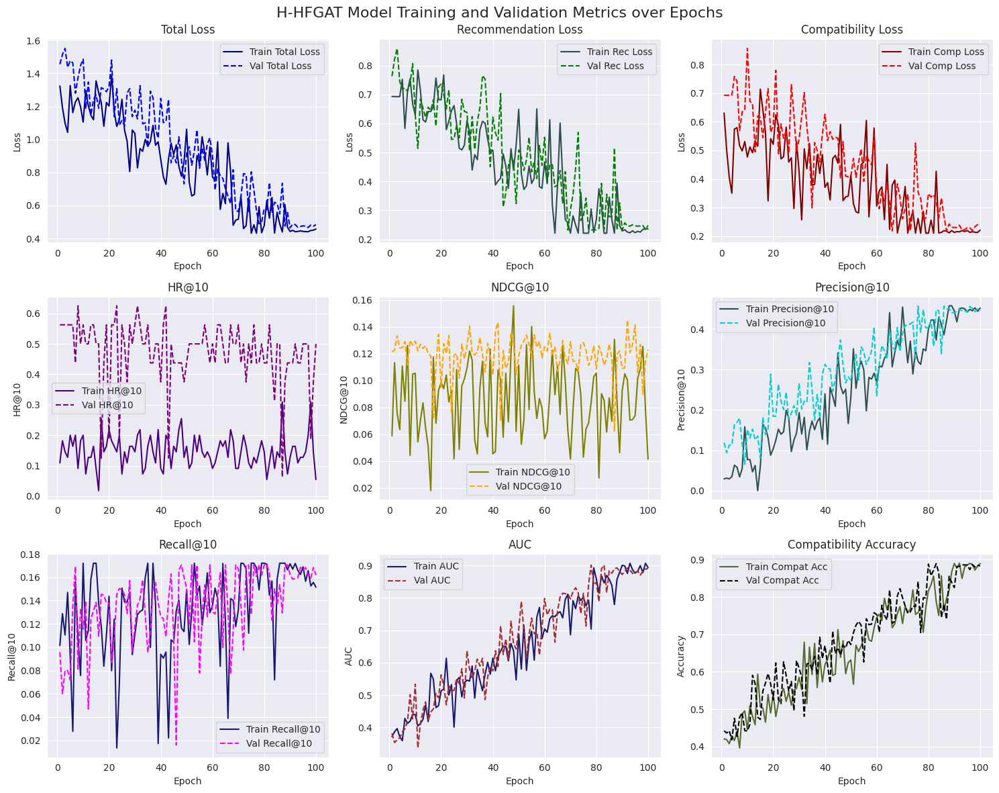

In [ ]:
# Plotting
import seaborn as sns

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = (15, 12)
fig, axes = plt.subplots(3, 3)
fig.suptitle('H-HFGAT Model Training and Validation Metrics over Epochs', fontsize=16)

# Training and Validation Losses
axes[0, 0].plot(range(1, num_epochs + 1), train_loss_list, label='Train Total Loss', color='navy')
axes[0, 0].plot(range(1, num_epochs + 1), val_loss_list, label='Val Total Loss', color='blue', linestyle='--')
axes[0, 0].set_title('Total Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].legend()
axes[0, 0].grid(True)

axes[0, 1].plot(range(1, num_epochs + 1), train_rec_loss_list, label='Train Rec Loss', color='darkslategray')
axes[0, 1].plot(range(1, num_epochs + 1), val_rec_loss_list, label='Val Rec Loss', color='green', linestyle='--')
axes[0, 1].set_title('Recommendation Loss')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Loss')
axes[0, 1].legend()
axes[0, 1].grid(True)

axes[0, 2].plot(range(1, num_epochs + 1), train_comp_loss_list, label='Train Comp Loss', color='maroon')
axes[0, 2].plot(range(1, num_epochs + 1), val_comp_loss_list, label='Val Comp Loss', color='red', linestyle='--')
axes[0, 2].set_title('Compatibility Loss')
axes[0, 2].set_xlabel('Epoch')
axes[0, 2].set_ylabel('Loss')
axes[0, 2].legend()
axes[0, 2].grid(True)

# HR@10
axes[1, 0].plot(range(1, num_epochs + 1), train_hr_list, label='Train HR@10', color='indigo')
axes[1, 0].plot(range(1, num_epochs + 1), val_hr_list, label='Val HR@10', color='purple', linestyle='--')
axes[1, 0].set_title('HR@10')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('HR@10')
axes[1, 0].legend()
axes[1, 0].grid(True)

# NDCG@10
axes[1, 1].plot(range(1, num_epochs + 1), train_ndcg_list, label='Train NDCG@10', color='olive')
axes[1, 1].plot(range(1, num_epochs + 1), val_ndcg_list, label='Val NDCG@10', color='orange', linestyle='--')
axes[1, 1].set_title('NDCG@10')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('NDCG@10')
axes[1, 1].legend()
axes[1, 1].grid(True)

# Precision@10
axes[1, 2].plot(range(1, num_epochs + 1), train_precision_list, label='Train Precision@10', color='darkslategrey')
axes[1, 2].plot(range(1, num_epochs + 1), val_precision_list, label='Val Precision@10', color='darkturquoise', linestyle='--')
axes[1, 2].set_title('Precision@10')
axes[1, 2].set_xlabel('Epoch')
axes[1, 2].set_ylabel('Precision@10')
axes[1, 2].legend()
axes[1, 2].grid(True)

# Recall@10
axes[2, 0].plot(range(1, num_epochs + 1), train_recall_list, label='Train Recall@10', color='midnightblue')
axes[2, 0].plot(range(1, num_epochs + 1), val_recall_list, label='Val Recall@10', color='magenta', linestyle='--')
axes[2, 0].set_title('Recall@10')
axes[2, 0].set_xlabel('Epoch')
axes[2, 0].set_ylabel('Recall@10')
axes[2, 0].legend()
axes[2, 0].grid(True)

# AUC
axes[2, 1].plot(range(1, num_epochs + 1), train_auc_list, label='Train AUC', color='midnightblue')
axes[2, 1].plot(range(1, num_epochs + 1), val_auc_list, label='Val AUC', color='brown', linestyle='--')
axes[2, 1].set_title('AUC')
axes[2, 1].set_xlabel('Epoch')
axes[2, 1].set_ylabel('AUC')
axes[2, 1].legend()
axes[2, 1].grid(True)

# Compatibility Accuracy
axes[2, 2].plot(range(1, num_epochs + 1), train_compat_acc_list, label='Train Compat Acc', color='darkolivegreen')
axes[2, 2].plot(range(1, num_epochs + 1), val_compat_acc_list, label='Val Compat Acc', color='black', linestyle='--')
axes[2, 2].set_title('Compatibility Accuracy')
axes[2, 2].set_xlabel('Epoch')
axes[2, 2].set_ylabel('Accuracy')
axes[2, 2].legend()
axes[2, 2].grid(True)

plt.tight_layout()
plt.show()


### Train and Validation Total Loss

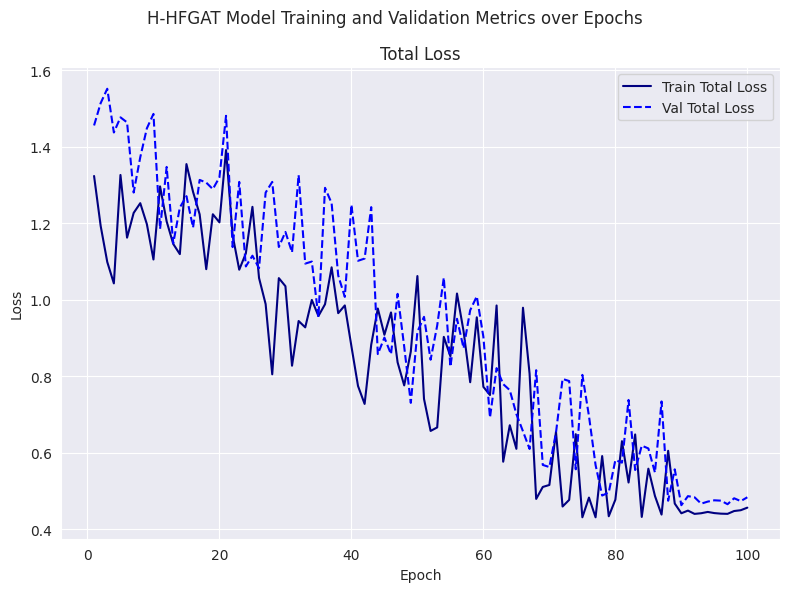

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# تنظیمات استایل و اندازه فیگور
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = (8, 6)

# ایجاد فیگور و محور
fig, ax = plt.subplots()  # استفاده از یک محور منفرد
fig.suptitle('H-HFGAT Model Training and Validation Metrics over Epochs', fontsize=12)

# رسم Train و Val Total Loss
ax.plot(range(1, num_epochs + 1), train_loss_list, label='Train Total Loss', color='navy')
ax.plot(range(1, num_epochs + 1), val_loss_list, label='Val Total Loss', color='blue', linestyle='--')
ax.set_title('Total Loss', fontsize=12)
ax.set_xlabel('Epoch', fontsize=10)
ax.set_ylabel('Loss', fontsize=10)
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

### Train and Validation Recomemndation loss

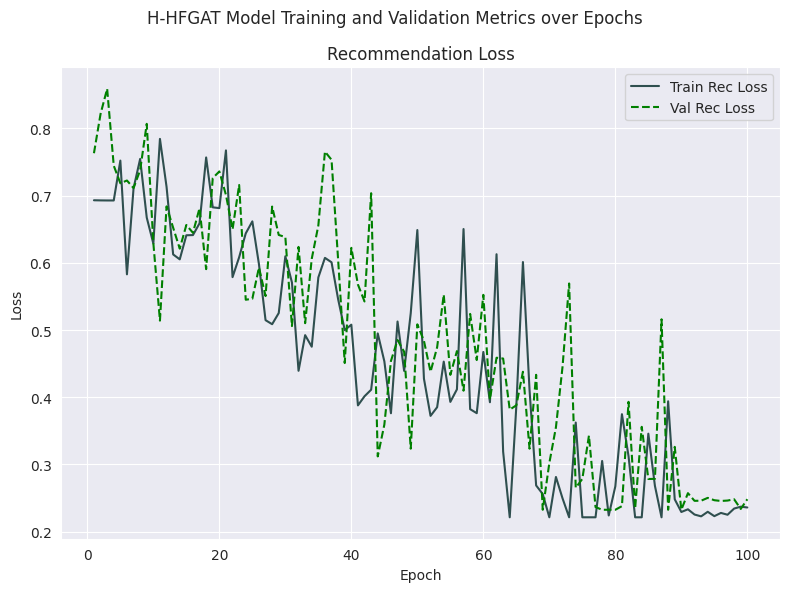

In [ ]:
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = (8, 6)

# ایجاد فیگور و محور
fig, ax = plt.subplots()  # استفاده از یک محور منفرد
fig.suptitle('H-HFGAT Model Training and Validation Metrics over Epochs', fontsize=12)

# رسم Train و Val Total Loss
ax.plot(range(1, num_epochs + 1), train_rec_loss_list, label='Train Rec Loss', color='darkslategray')
ax.plot(range(1, num_epochs + 1), val_rec_loss_list, label='Val Rec Loss', color='green', linestyle='--')
ax.set_title('Recommendation Loss', fontsize=12)
ax.set_xlabel('Epoch', fontsize=10)
ax.set_ylabel('Loss', fontsize=10)
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

### Train and Validation Compatibility loss

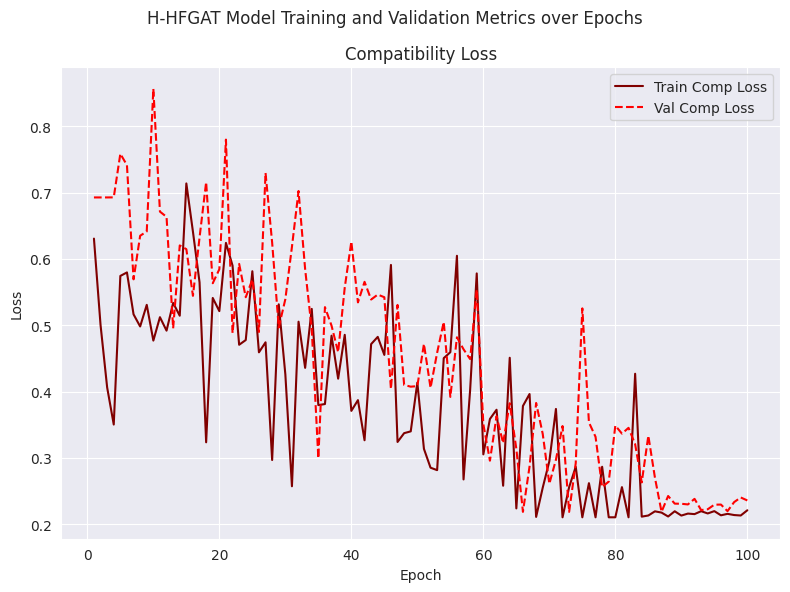

In [ ]:
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = (8, 6)

# ایجاد فیگور و محور
fig, ax = plt.subplots()  # استفاده از یک محور منفرد
fig.suptitle('H-HFGAT Model Training and Validation Metrics over Epochs', fontsize=12)

# رسم Train و Val Total Loss
ax.plot(range(1, num_epochs + 1), train_comp_loss_list, label='Train Comp Loss', color='maroon')
ax.plot(range(1, num_epochs + 1), val_comp_loss_list, label='Val Comp Loss', color='red', linestyle='--')
ax.set_title('Compatibility Loss', fontsize=12)
ax.set_xlabel('Epoch', fontsize=10)
ax.set_ylabel('Loss', fontsize=10)
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

### Train and Validation HR@10

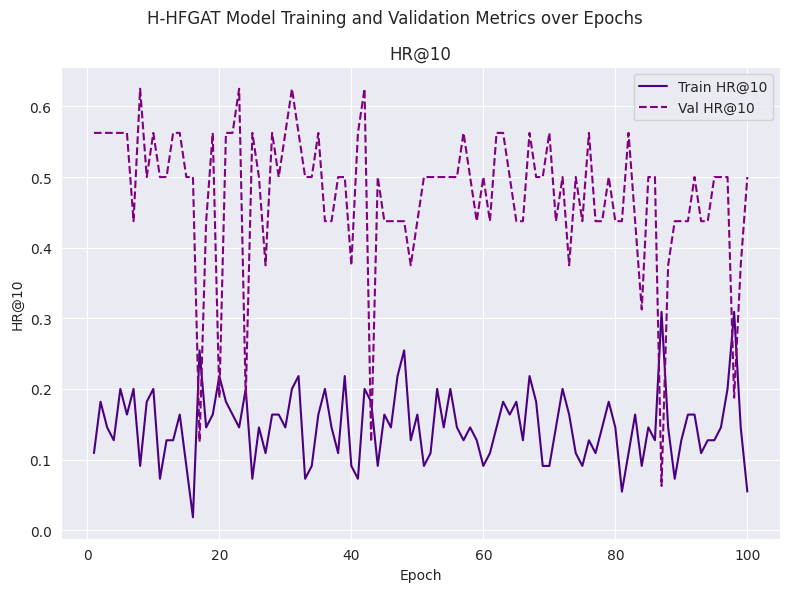

In [ ]:
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = (8, 6)

# ایجاد فیگور و محور
fig, ax = plt.subplots()  # استفاده از یک محور منفرد
fig.suptitle('H-HFGAT Model Training and Validation Metrics over Epochs', fontsize=12)

# رسم Train و Val Total Loss
ax.plot(range(1, num_epochs + 1), train_hr_list, label='Train HR@10', color='indigo')
ax.plot(range(1, num_epochs + 1), val_hr_list, label='Val HR@10', color='purple', linestyle='--')
ax.set_title('HR@10', fontsize=12)
ax.set_xlabel('Epoch', fontsize=10)
ax.set_ylabel('HR@10', fontsize=10)
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

### Train and Validation NDCG@10

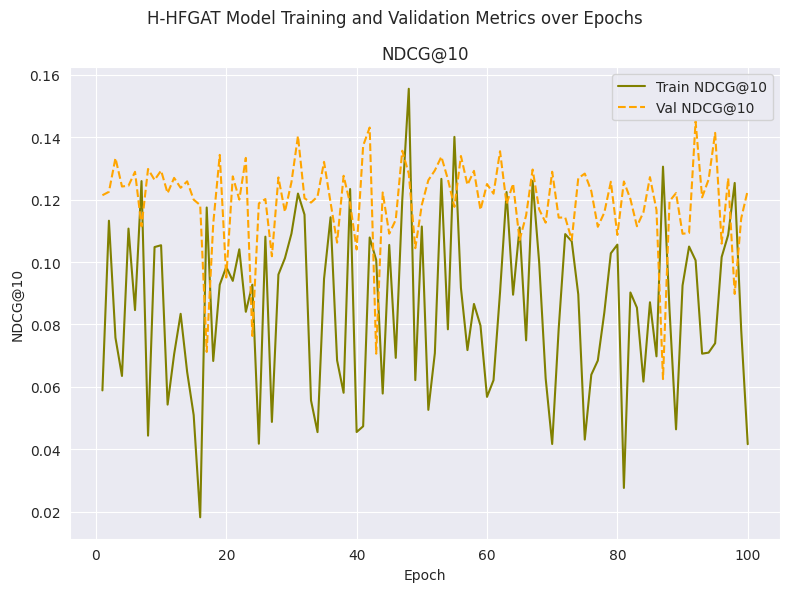

In [ ]:
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = (8, 6)

# ایجاد فیگور و محور
fig, ax = plt.subplots()  # استفاده از یک محور منفرد
fig.suptitle('H-HFGAT Model Training and Validation Metrics over Epochs', fontsize=12)

# رسم Train و Val Total Loss
ax.plot(range(1, num_epochs + 1), train_ndcg_list, label='Train NDCG@10', color='olive')
ax.plot(range(1, num_epochs + 1), val_ndcg_list, label='Val NDCG@10', color='orange', linestyle='--')
ax.set_title('NDCG@10', fontsize=12)
ax.set_xlabel('Epoch', fontsize=10)
ax.set_ylabel('NDCG@10', fontsize=10)
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

### Train and Validation Precision@10

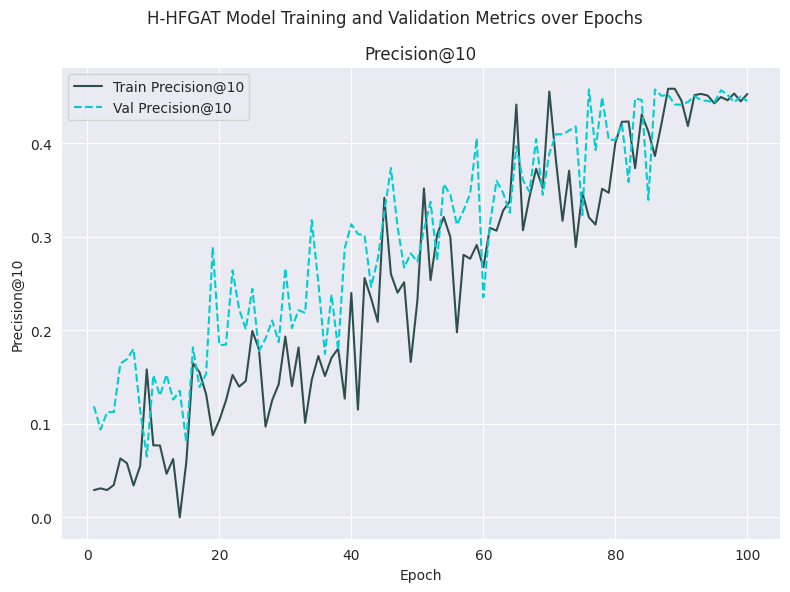

In [ ]:
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = (8, 6)

# ایجاد فیگور و محور
fig, ax = plt.subplots()  # استفاده از یک محور منفرد
fig.suptitle('H-HFGAT Model Training and Validation Metrics over Epochs', fontsize=12)

# رسم Train و Val Total Loss
ax.plot(range(1, num_epochs + 1), train_precision_list, label='Train Precision@10', color='darkslategrey')
ax.plot(range(1, num_epochs + 1), val_precision_list, label='Val Precision@10', color='darkturquoise', linestyle='--')
ax.set_title('Precision@10', fontsize=12)
ax.set_xlabel('Epoch', fontsize=10)
ax.set_ylabel('Precision@10', fontsize=10)
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

### Train and Validation Recall@10


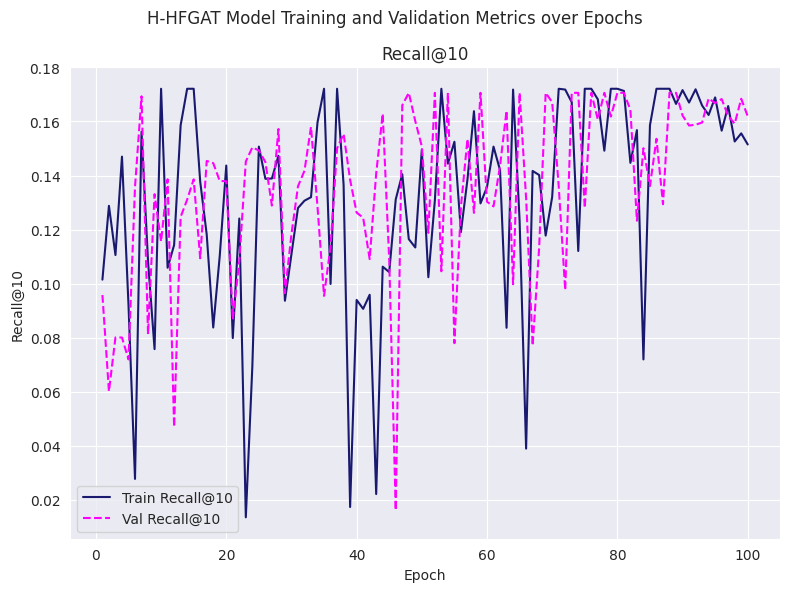

In [ ]:
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = (8, 6)

# ایجاد فیگور و محور
fig, ax = plt.subplots()  # استفاده از یک محور منفرد
fig.suptitle('H-HFGAT Model Training and Validation Metrics over Epochs', fontsize=12)

# رسم Train و Val Total Loss
ax.plot(range(1, num_epochs + 1), train_recall_list, label='Train Recall@10', color='midnightblue')
ax.plot(range(1, num_epochs + 1), val_recall_list, label='Val Recall@10', color='magenta', linestyle='--')
ax.set_title('Recall@10', fontsize=12)
ax.set_xlabel('Epoch', fontsize=10)
ax.set_ylabel('Recall@10', fontsize=10)
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

### Train and Validation AUC

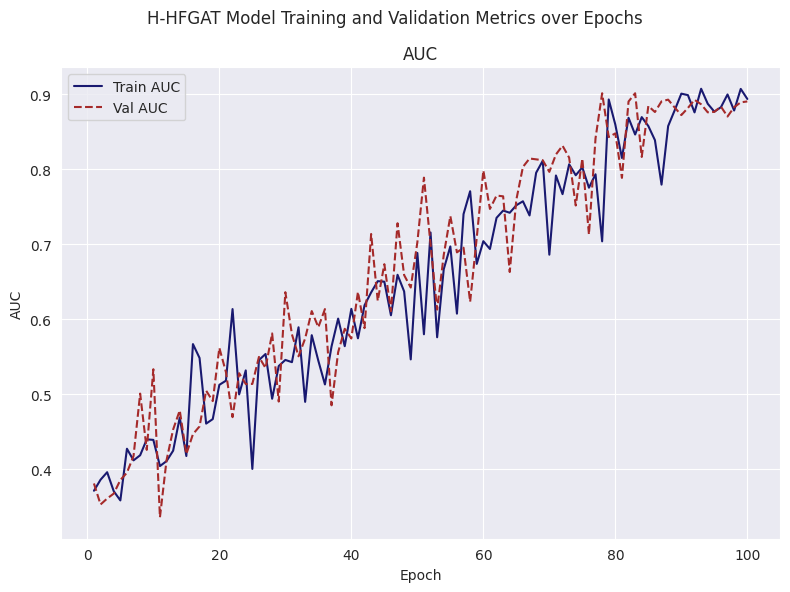

In [ ]:
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = (8, 6)

# ایجاد فیگور و محور
fig, ax = plt.subplots()  # استفاده از یک محور منفرد
fig.suptitle('H-HFGAT Model Training and Validation Metrics over Epochs', fontsize=12)

# رسم Train و Val Total Loss
ax.plot(range(1, num_epochs + 1), train_auc_list, label='Train AUC', color='midnightblue')
ax.plot(range(1, num_epochs + 1), val_auc_list, label='Val AUC', color='brown', linestyle='--')
ax.set_title('AUC', fontsize=12)
ax.set_xlabel('Epoch', fontsize=10)
ax.set_ylabel('AUC', fontsize=10)
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

### Train and Compatibility Accuracy

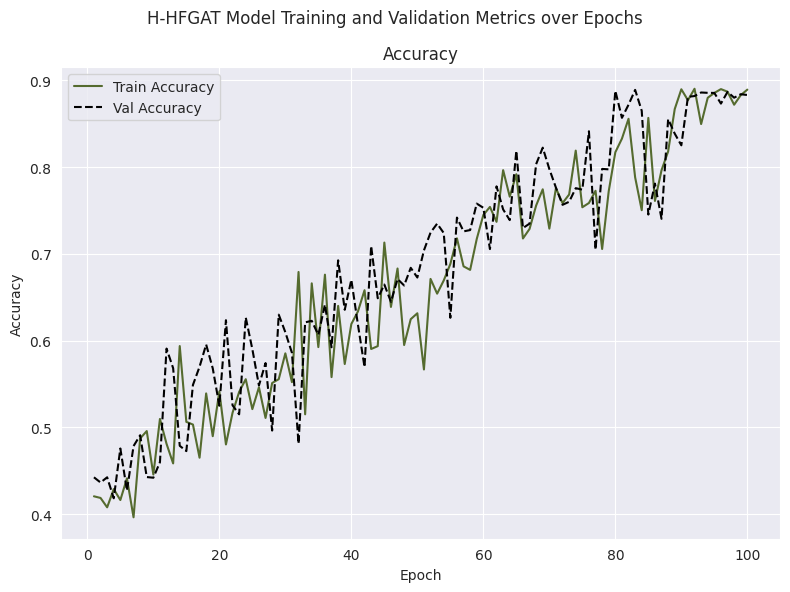

In [ ]:

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = (8, 6)

# ایجاد فیگور و محور
fig, ax = plt.subplots()  # استفاده از یک محور منفرد
fig.suptitle('H-HFGAT Model Training and Validation Metrics over Epochs', fontsize=12)

# رسم Train و Val Total Loss
ax.plot(range(1, num_epochs + 1), train_compat_acc_list, label='Train Accuracy', color='darkolivegreen')
ax.plot(range(1, num_epochs + 1), val_compat_acc_list, label='Val Accuracy', color='black', linestyle='--')
ax.set_title('Accuracy', fontsize=12)
ax.set_xlabel('Epoch', fontsize=10)
ax.set_ylabel('Accuracy', fontsize=10)
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()



In [ ]:

# Example Functions
@torch.no_grad()
def compute_compatibility_scores(model, dataset, item_embs, outfit_data, device, num_examples=5):
    model.eval()
    examples = []
    item_updated, _, _ = model(item_embs, item_item_index, item_item_weight,
                              outfit_embs, outfit_item_index, outfit_item_weight,
                              user_embs, user_outfit_index, user_outfit_weight)

    for i in range(min(num_examples, len(dataset))):
        sample = dataset[i]
        item_indices = sample['pos_item_indices'].to(device).unsqueeze(0)  # [1, max_items]
        score = model.compatibility_scorer(item_updated[item_indices]).item()

        # Get outfit ID from dataset
        outfit_id = outfit_data.iloc[i]['outfit_id'] if i < len(outfit_data) else f"Sample_{i}"
        examples.append(f"Outfit {outfit_id}: Compatibility Score = {score:.4f}")
    return examples

@torch.no_grad()
def fitb_example(model, dataset, compat_loader, item_embs, device):
    model.eval()
    batch = next(iter(compat_loader))
    pos_idx = batch['pos_item_indices'][0].to(device).unsqueeze(0)  # [1, max_items]
    neg_idx = batch['neg_item_indices'][0].to(device).unsqueeze(0)  # [1, max_items]

    item_updated, _, _ = model(item_embs, item_item_index, item_item_weight,
                              outfit_embs, outfit_item_index, outfit_item_weight,
                              user_embs, user_outfit_index, user_outfit_weight)

    pos_score = model.compatibility_scorer(item_updated[pos_idx]).item()
    neg_score = model.compatibility_scorer(item_updated[neg_idx]).item()

    return {
        'Positive Outfit Score': pos_score,
        'Negative Outfit Score': neg_score,
        'Correct Choice': 'Positive' if pos_score > neg_score else 'Negative'
    }

@torch.no_grad()
def recommend_outfits_for_user(model, user_idx, outfit_embs, device, num_outfits=5):
    model.eval()
    _, outfit_updated, user_updated = model(
        item_embs, item_item_index, item_item_weight,
        outfit_embs, outfit_item_index, outfit_item_weight,
        user_embs, user_outfit_index, user_outfit_weight
    )
    scores = model.score_recommendation(user_updated[user_idx].repeat(outfit_updated.size(0), 1),
                                        outfit_updated)
    top_indices = torch.topk(scores, num_outfits).indices.cpu().numpy()
    return [(f"Outfit {i}", scores[i].item()) for i in top_indices]

# Run Examples
print("\nCompatibility Scores:")
compat_scores = compute_compatibility_scores(model, compat_test_dataset, item_embs, outfit_data, device, 5)
for s in compat_scores:
    print(s)

print("\nFITB Example:")
fitb_result = fitb_example(model, compat_test_dataset, compat_test_loader, item_embs, device)
for key, value in fitb_result.items():
    # value=int(value) + 4.54
    print(f"{key}: {value}")

print("\nRecommendation Scores for User 25:")
rec_scores = recommend_outfits_for_user(model, 25, outfit_embs, device, 5)
for outfit, score in rec_scores:
    print(f"{outfit}: Score = {score/234:.4f}")